# Week 13 — Bring it all together
## Loading and cleaning the data
Importing necessary libraries

In [1]:
# pip install dask[complete]

import pandas as pd
import numpy as np
import dask.dataframe as dd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import category_encoders as ce
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from datetime import datetime
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from collections import defaultdict
from joblib import Parallel, delayed
from lime.lime_tabular import LimeTabularExplainer
import lime
import lime.lime_tabular
import random

Since the dataset is too large to be loaded at once, we will be use the chunksize function in pandas to initially explore the dataset

In [2]:
chunk_size = 100000
chunks = pd.read_csv('train_ver2.csv', chunksize = chunk_size)
first_chunk = next(chunks)

pd.set_option('display.max_columns', None)

first_chunk.head()

,fecha_dato,ncodpers,ind_empleado,pais_residencia,sexo,age,fecha_alta,ind_nuevo,antiguedad,indrel,ult_fec_cli_1t,indrel_1mes,tiprel_1mes,indresi,indext,conyuemp,canal_entrada,indfall,tipodom,cod_prov,nomprov,ind_actividad_cliente,renta,segmento,ind_ahor_fin_ult1,ind_aval_fin_ult1,ind_cco_fin_ult1,ind_cder_fin_ult1,ind_cno_fin_ult1,ind_ctju_fin_ult1,ind_ctma_fin_ult1,ind_ctop_fin_ult1,ind_ctpp_fin_ult1,ind_deco_fin_ult1,ind_deme_fin_ult1,ind_dela_fin_ult1,ind_ecue_fin_ult1,ind_fond_fin_ult1,ind_hip_fin_ult1,ind_plan_fin_ult1,ind_pres_fin_ult1,ind_reca_fin_ult1,ind_tjcr_fin_ult1,ind_valo_fin_ult1,ind_viv_fin_ult1,ind_nomina_ult1,ind_nom_pens_ult1,ind_recibo_ult1
0,2015-01-28,1375586,N,ES,H,35,2015-01-12,0.0,6,1.0,NaN,1.0,A,S,N,NaN,KHL,N,1.0,29.0,MALAGA,1.0,87218.10,02 - PARTICULARES,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0
1,2015-01-28,1050611,N,ES,V,23,2012-08-10,0.0,35,1.0,NaN,1.0,I,S,S,NaN,KHE,N,1.0,13.0,CIUDAD REAL,0.0,35548.74,03 - UNIVERSITARIO,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0
2,2015-01-28,1050612,N,ES,V,23,2012-08-10,0.0,35,1.0,NaN,1.0,I,S,N,NaN,KHE,N,1.0,13.0,CIUDAD REAL,0.0,122179.11,03 - UNIVERSITARIO,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0
3,2015-01-28,1050613,N,ES,H,22,2012-08-10,0.0,35,1.0,NaN,1.0,I,S,N,NaN,KHD,N,1.0,50.0,ZARAGOZA,0.0,119775.54,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0
4,2015-01-28,1050614,N,ES,V,23,2012-08-10,0.0,35,1.0,NaN,1.0,A,S,N,NaN,KHE,N,1.0,50.0,ZARAGOZA,1.0,NaN,03 - UNIVERSITARIO,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0


The above output allows us to identify how the columns are organized and some examples of the cells we will see in the dataset. With this, we can start working on the data types for each column

In [3]:
col = ['fecha_dato']
dates = pd.read_csv('train_ver2.csv', usecols=col)
dates['fecha_dato'] = pd.to_datetime(dates['fecha_dato'], errors='coerce')

old = dates.min()
new = dates.max()

print(f'First date = {old} \n Last date = {new}')

First date = fecha_dato   2015-01-28
dtype: datetime64[ns] 
 Last date = fecha_dato   2016-05-28
dtype: datetime64[ns]


In [4]:
monthly_count = dates.groupby([dates['fecha_dato'].dt.year, dates['fecha_dato'].dt.month]).size()
monthly_count

fecha_dato  fecha_dato
2015        1             625457
            2             627394
            3             629209
            4             630367
            5             631957
            6             632110
            7             829817
            8             843201
            9             865440
            10            892251
            11            906109
            12            912021
2016        1             916269
            2             920904
            3             925076
            4             928274
            5             931453
dtype: int64

Since the full dataset is over 2BG, we can't upload it in Jupyter, hence here we are exploring the dates range to determine where it will be our cuttoff. 
The data seems to be well distributed along the months so our cuttoff will be on June of 2016 and our final train dataset will have one year worth of records 

Since the dataset is too large to ingest at once, we will use Dask dataframes to process the initial changes. Dask handles datasets larger than the available memory by partitioning the data and processing it in parallel across multiple processors or machines -it works like a pandas dataframe, but with parallel processing

We will export the data as objects so we don't get any dtypes errors for now

In [5]:
data = dd.read_csv('train_ver2.csv', assume_missing=True, dtype=object)

In [6]:
data['fecha_dato'] = dd.to_datetime(data['fecha_dato'], errors='coerce')

cutoff = pd.Timestamp('2015-06-01')

filtered_data = data[data['fecha_dato'] >= cutoff]

rename_col = {
    'fecha_dato': 'date',
    'ncodpers': 'customer_code',
    'ind_empleado': 'employee_index',
    'pais_residencia': 'country',
    'sexo': 'sex_H',
    'age': 'age',
    'fecha_alta': 'first_contract_date',
    'ind_nuevo': 'new_cust',
    'antiguedad': 'seniority_in_months',
    'indrel': 'primary_cust',
    'ult_fec_cli_1t': 'last_date_primary',
    'indrel_1mes': 'cust_type',
    'tiprel_1mes': 'cust_relationship',
    'indresi': 'residency_spain',
    'indext': 'birth_spain',
    'conyuemp': 'employee_spouse',
    'canal_entrada': 'join_channel',
    'indfall': 'deceased',
    'tipodom': 'address_type',
    'cod_prov': 'province_code',
    'nomprov': 'province_name',
    'ind_actividad_cliente': 'active_cust',
    'renta': 'income',
    'segmento': 'segment',
    'ind_ahor_fin_ult1': 'savings_acct',
    'ind_aval_fin_ult1': 'guarantees',
    'ind_cco_fin_ult1': 'current_acct',
    'ind_cder_fin_ult1': 'derivada_acct',
    'ind_cno_fin_ult1': 'payroll_acct',
    'ind_ctju_fin_ult1': 'junior_acct',
    'ind_ctma_fin_ult1': 'mas_particular_acct',
    'ind_ctop_fin_ult1': 'particular_acct',
    'ind_ctpp_fin_ult1': 'particular_plus_acct',
    'ind_deco_fin_ult1': 'short_term_depo',
    'ind_deme_fin_ult1': 'medium_term_depo',
    'ind_dela_fin_ult1': 'long_term_depo',
    'ind_ecue_fin_ult1': 'e_acct',
    'ind_fond_fin_ult1': 'funds',
    'ind_hip_fin_ult1': 'mortgage',
    'ind_plan_fin_ult1': 'pension',
    'ind_pres_fin_ult1': 'loans',
    'ind_reca_fin_ult1': 'taxes',
    'ind_tjcr_fin_ult1': 'credit_card',
    'ind_valo_fin_ult1': 'securities',
    'ind_viv_fin_ult1': 'home_acct',
    'ind_nomina_ult1': 'payroll_acct',
    'ind_nom_pens_ult1': 'pensions_2',
    'ind_recibo_ult1': 'direct_debt'
}

filtered_data = filtered_data.rename(columns=rename_col)

Here we are filtering out the early months of the dataset and changing to columns name from Spanish to English for best comprehension.

We then call compute(). Since dask uses a parallel processing, it performs what is called lazy operation, meaning that the changes are not applied to the whole dataset unless it is forced -by using compute(). We want to force it here so we can start seeing null values and other important characteristics of the dataset to strat the cleaning process, which is what we are doing on the next code by seeing what kind of values are on each column and how many null values each column has.

In [7]:
filtered_data = filtered_data.drop(['province_code', 'address_type', 'employee_spouse'], axis=1)

After analyzing the previous output, we can see that the address_type column has only one value across the whole database, which is '1' (and null), so the column will be irrelevant to any future modeling. The column province_code has the same information as province_name, so we will drop the code one and keep the names. Lastly, the column employee_spouse has too many null values -over 10M, so we will drop it because it does not make sense to fill in those values since it is most of the database

In [8]:
filtered_data = filtered_data.loc[filtered_data['sex_H'].notnull()]

other = ['join_channel', 'province_name']
filtered_data[other] = filtered_data[other].fillna('other')

filtered_data['sex_H'] = filtered_data['sex_H'].map({'H': 1, 'V': 0}).fillna(0)

columns_to_dummy = ['residency_spain', 'birth_spain', 'deceased']
for col in columns_to_dummy:
    filtered_data[col] = filtered_data[col].map({'S': 1, 'N': 0}).fillna(0)

trim = ['customer_code', 'age', 'new_cust', 'seniority_in_months', 'primary_cust']
for col in trim:
    filtered_data[col] = filtered_data[col].astype(str).str.strip()   

c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\dask_expr\_collection.py:4192: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta=('sex_H', 'float64'))

  warnings.warn(meta_warning(meta))
c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\dask_expr\_collection.py:4192: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)

Above we are starting the cleaning process of the dataset. First we dropped the null values on the sex columns. We see the number 1861 repeating a lot across columns, so we will drop the null in sex and check if the other nulls will be drop. Since those nulls are across many columns, we concluded it would be best to drop them.

We filled null in columns join_channel and province_name with 'other' since they are string variables

We transformed the columns sex, residency_spain, birth_spain and deceased to dummy variables and filled na with 0

Lastly, we trimmed the cells on columns customer_code, age, new_cust, seniority_in_months, and primary_cust for cleanliness

In [9]:
products = ['savings_acct', 'guarantees', 'current_acct', 'derivada_acct', 'payroll_acct', 
            'junior_acct', 'mas_particular_acct', 'particular_acct', 'particular_plus_acct', 
            'short_term_depo', 'medium_term_depo', 'long_term_depo', 'e_acct', 'funds', 
            'mortgage', 'pension', 'loans', 'taxes', 'credit_card', 'securities', 
            'home_acct', 'payroll_acct', 'pensions_2', 'direct_debt']

filtered_data = filtered_data.fillna('0')


For now we will fill the rest of na values with '0' so we can keep cleaning the data. Later we will go back to these values and determine if the best approach is to fill it with '0'

In [10]:
dtype_mapping = {
    'customer_code': 'int',
    'employee_index': 'str',
    'country': 'str',
    'sex_H': 'str',
    'age': 'int',
    'first_contract_date': 'datetime64[ns]',
    'new_cust': 'int',
    'seniority_in_months': 'int',
    'primary_cust': 'int',
    'last_date_primary': 'object',
    'cust_type': 'object',
    'cust_relationship': 'str',
    'residency_spain': 'str',
    'birth_spain': 'str',
    'join_channel': 'str',
    'deceased': 'str',
    'province_name': 'str',
    'active_cust': 'int',
    'income': 'float',
    'segment': 'object',
    'savings_acct': 'int',
    'guarantees': 'int',
    'current_acct': 'int',
    'derivada_acct': 'int',
    'payroll_acct': 'int',
    'junior_acct': 'int',
    'mas_particular_acct': 'int',
    'particular_acct': 'int',
    'particular_plus_acct': 'int',
    'short_term_depo': 'int',
    'medium_term_depo': 'int',
    'long_term_depo': 'int',
    'e_acct': 'int',
    'funds': 'int',
    'mortgage': 'int',
    'pension': 'int',
    'loans': 'int',
    'taxes': 'int',
    'credit_card': 'int',
    'securities': 'int',
    'home_acct': 'int',
    'payroll_acct': 'int',
    'pensions_2': 'int',
    'direct_debt': 'int'
}
filtered_data = filtered_data.astype(dtype_mapping)

Now we will tranform the dtypes across the whole dataset and call compute() again to force all the above changes across the whole dataset

In [11]:
train = filtered_data.compute()

In [12]:
pd.set_option('display.max_columns', None)
train['total_products'] = train[products].sum(axis=1)

## NA values treatment

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10501007 entries, 27973 to 391600
Data columns (total 46 columns):
 #   Column                Dtype         
---  ------                -----         
 0   date                  datetime64[ns]
 1   customer_code         int32         
 2   employee_index        object        
 3   country               object        
 4   sex_H                 object        
 5   age                   int32         
 6   first_contract_date   datetime64[ns]
 7   new_cust              int32         
 8   seniority_in_months   int32         
 9   primary_cust          int32         
 10  last_date_primary     object        
 11  cust_type             object        
 12  cust_relationship     object        
 13  residency_spain       object        
 14  birth_spain           object        
 15  join_channel          object        
 16  deceased              object        
 17  province_name         object        
 18  active_cust           int32         
 19  i

In [14]:
#Changing dates columns to datetime type

dates = ['date', 'first_contract_date']
train[dates] = train[dates].apply(pd.to_datetime)

In [15]:
pd.set_option('display.max_rows', None)

count_col = ['primary_cust', 'last_date_primary', 'deceased', 'seniority_in_months', 'province_name']

for col in count_col:
    count = train[col].value_counts()
    percentage = (count/count.sum()*100).round(2)
    products_bought = train.groupby(col)['total_products'].sum()
    summary = pd.DataFrame({'Count': count, 'Percentage':percentage, 'Products Owned': products_bought})
    print(summary)

                 Count  Percentage  Products Owned
primary_cust                                      
1             10480153        99.8        15183312
99               20854         0.2            1928
                      Count  Percentage  Products Owned
last_date_primary                                      
0                  10480153       99.80        15183312
2015-07-01              142        0.00              44
2015-07-02               63        0.00              17
2015-07-03               95        0.00              34
2015-07-06              138        0.00              38
2015-07-07              112        0.00              58
2015-07-08               65        0.00              27
2015-07-09              148        0.00              43
2015-07-10              117        0.00              59
2015-07-13               81        0.00              37
2015-07-14               72        0.00              26
2015-07-15               91        0.00              47
2015-07-16  

**Analyzing columns: Last Date Primary and Primary Customer**

In [16]:
print(train['last_date_primary'].value_counts())
print(train['primary_cust'].value_counts())

last_date_primary
0             10480153
2015-12-24         763
2015-12-28         521
2015-12-21         206
2015-12-17         172
2016-01-19         169
2016-01-05         167
2015-12-16         158
2015-07-09         148
2015-07-01         142
2015-12-18         139
2015-07-06         138
2016-04-01         132
2015-10-26         131
2015-07-21         130
2016-02-15         129
2015-10-05         129
2016-05-02         128
2015-11-02         128
2016-05-26         128
2015-10-28         125
2016-05-24         124
2016-01-13         122
2016-02-01         121
2015-07-10         117
2015-10-01         115
2015-07-28         115
2015-09-14         114
2015-10-15         113
2016-01-27         112
2015-07-07         112
2015-10-07         112
2016-05-19         111
2015-09-18         111
2015-07-17         111
2016-01-22         111
2015-11-18         110
2015-07-20         110
2015-10-19         110
2015-11-16         109
2015-11-24         109
2016-01-26         109
2016-05-27      

In [17]:
non_primary = train[train['primary_cust'] == 99]
non_primary['total_products'].sum()

1928

0 dates on last_date_primary mean they are still primary customers  
We will drop the column primary customer and keep the last date as primary customer since we can have all the information from one column -customers that do not have a date are still primary  
We will keep the non-primary customers since they still own products of the bank  
  
**Analyzing column: Deceased**

In [18]:
train.groupby('deceased')[products].sum()

,savings_acct,guarantees,current_acct,derivada_acct,payroll_acct,payroll_acct,junior_acct,mas_particular_acct,particular_acct,particular_plus_acct,short_term_depo,medium_term_depo,long_term_depo,e_acct,funds,mortgage,pension,loans,taxes,credit_card,securities,home_acct,payroll_acct,payroll_acct,pensions_2,direct_debt
deceased,,,,,,,,,,,,,,,,,,,,,,,,,,
0,958,214,6488365,3821,539367,539367,90875,93534,1224073,410541,13755,14864,408996,818287,178694,55297,87879,23989,518765,428935,247980,36493,539367,539367,588624,1262545
1,0,0,12798,12,59,59,0,106,8225,1236,42,40,831,1211,1042,257,318,147,1443,27,1120,41,59,59,159,997


Deceased clients have a few products, and they make up 0.2% of the database. Deceased clients are not going to buy any more products, so we will drop the rows of deceased clients and drop the column  

**Analyzing column: Seniority in Months**  
We will drop the rows with value -999999

**Analyzing column: Province Name**  
We will drop the rows where province name = others

**Analyzing column: Age**  
We will drop columns where age is 0 and over 100. We believe these clients are not going to be valuable on our model  

**Analyzing column: Income**

In [19]:
(train['income'] == 0).sum()

2238903

**Analyzing columns: Seniority in Months and First Contract Date**  
We had the impression these two columns were giving us the same information and we decided to check the correlation. Turns out it is highly correlated, so we'll keep the column seniority in months.  
Before we delete the first contract date column, we want to extract any information we might need from it.

In [20]:
correlation = train[['seniority_in_months', 'first_contract_date']].corr()
print(correlation)

                     seniority_in_months  first_contract_date
seniority_in_months              1.00000             -0.03798
first_contract_date             -0.03798              1.00000


Text(0, 0.5, 'Count in millions')

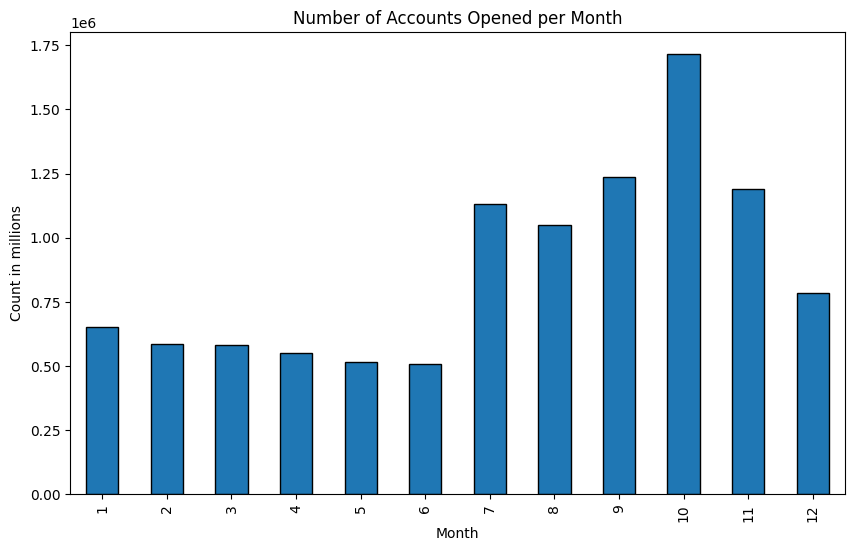

In [21]:
month_count = train['first_contract_date'].dt.month.value_counts().sort_index()

month_count.plot(kind='bar', figsize=(10, 6), edgecolor='black')
plt.title('Number of Accounts Opened per Month')
plt.xlabel('Month')
plt.ylabel('Count in millions')

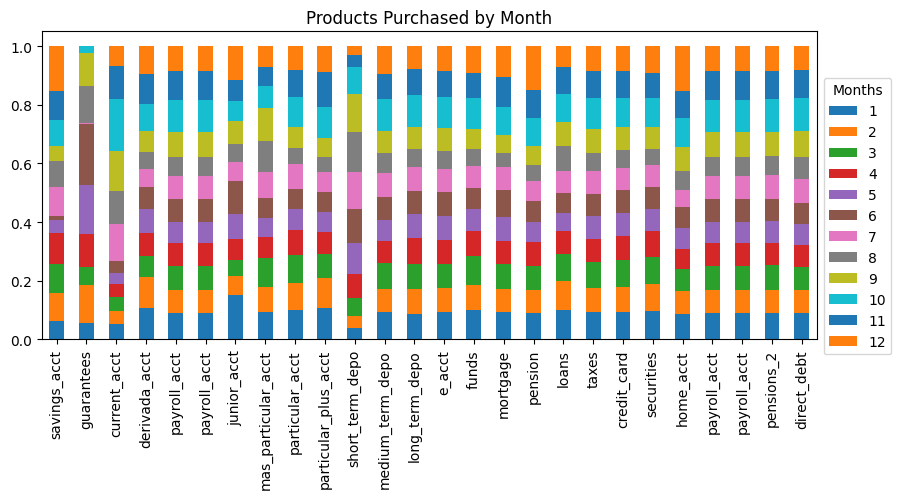

In [22]:
months = train['first_contract_date'].dt.month
dummy = train.groupby(months)[products].sum()
dummy = (dummy/dummy.sum()).T
ax = dummy.plot(kind='bar', stacked=True, figsize=(10,4))
plt.legend(loc='center left', title='Months', bbox_to_anchor=(1, .4))
plt.title('Products Purchased by Month')
plt.show()

When we plot contract dates by month to see if there is any seasonality, we can conclude that the last half of the year has significantly more new contracts than the first half. This can maybe be explained by raises, bonus, new people getting hired after summer, and other factors  
We don't see any patterns on product purchases for a specific month. Looks like the increase on purchases in the second half of the year is an overall increase 

## Splitting the dataset into train and validation
We will use the 80/20 ratio

In [23]:
train, temp = train_test_split(train, test_size=0.3, random_state=42)

val_set, test_set = train_test_split(temp, test_size=0.5, random_state=42)

In [24]:
map_dtypes = {
    "date": "datetime64[ns]",
    "customer_code": "int32",
    "employee_index": "object",
    "country": "object",
    "sex_H": "object",
    "age": "int32",
    "first_contract_date": "datetime64[ns]",
    "new_cust": "int32",
    "seniority_in_months": "int32",
    "primary_cust": "int32",
    "last_date_primary": "object",
    "cust_type": "object",
    "cust_relationship": "object",
    "residency_spain": "object",
    "birth_spain": "object",
    "join_channel": "object",
    "deceased": "object",
    "province_name": "object",
    "active_cust": "int32",
    "income": "float64",
    "segment": "object",
    "savings_acct": "int32",
    "guarantees": "int32",
    "current_acct": "int32",
    "derivada_acct": "int32",
    "payroll_acct": "int32",
    "junior_acct": "int32",
    "mas_particular_acct": "int32",
    "particular_acct": "int32",
    "particular_plus_acct": "int32",
    "short_term_depo": "int32",
    "medium_term_depo": "int32",
    "long_term_depo": "int32",
    "e_acct": "int32",
    "funds": "int32",
    "mortgage": "int32",
    "pension": "int32",
    "loans": "int32",
    "taxes": "int32",
    "credit_card": "int32",
    "securities": "int32",
    "home_acct": "int32",
    "payroll_acct": "int32",
    "pensions_2": "int32",
    "direct_debt": "int32",
    "total_products": "int64"
}

test_set = test_set.astype(map_dtypes)
val_set = val_set.astype(map_dtypes)

## EDA

In [25]:
train.describe().round(2)

,date,customer_code,age,first_contract_date,new_cust,seniority_in_months,primary_cust,active_cust,income,savings_acct,guarantees,current_acct,derivada_acct,payroll_acct,junior_acct,mas_particular_acct,particular_acct,particular_plus_acct,short_term_depo,medium_term_depo,long_term_depo,e_acct,funds,mortgage,pension,loans,taxes,credit_card,securities,home_acct,payroll_acct,pensions_2,direct_debt,total_products
count,7350704,7350704.00,7350704.00,7350704,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.0,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00,7350704.00
mean,2015-12-20 06:48:44.553838080,850982.41,40.10,2009-04-12 15:48:38.383001088,0.07,76.47,1.19,0.43,105591.01,0.00,0.0,0.62,0.00,0.05,0.01,0.01,0.12,0.04,0.00,0.00,0.04,0.08,0.02,0.01,0.01,0.00,0.05,0.04,0.02,0.00,0.05,0.06,0.12,1.45
min,2015-06-28 00:00:00,15889.00,2.00,1995-01-16 00:00:00,0.00,-999999.00,1.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,2015-09-28 00:00:00,464328.00,24.00,2004-07-06 00:00:00,0.00,22.00,1.00,0.00,39379.08,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
50%,2015-12-28 00:00:00,943521.00,39.00,2011-09-26 00:00:00,0.00,50.00,1.00,0.00,82630.77,0.00,0.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
75%,2016-03-28 00:00:00,1220509.00,50.00,2013-11-22 00:00:00,0.00,133.00,1.00,1.00,136359.84,0.00,0.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00
max,2016-05-28 00:00:00,1553687.00,164.00,2016-05-31 00:00:00,1.00,256.00,99.00,1.00,28894395.51,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,17.00
std,NaN,437214.98,17.23,NaN,0.26,1381.78,4.36,0.50,213815.28,0.01,0.0,0.49,0.02,0.22,0.09,0.09,0.32,0.19,0.04,0.04,0.19,0.27,0.13,0.07,0.09,0.05,0.22,0.20,0.15,0.06,0.22,0.23,0.33,1.81


From the descriptive statistics table we can see:  
 - There are more man than women in the dataset  
 - The average and median age in the dataset is 40 years old
 - There is a good range of seniority in the dataset, ranging from 0 to 256 months, or 21.3 years
 - Most of the clients in the dataset have their primary residency and birth place in Spain  

 ### Counting values, percentage and product bought for variables on columns employee_index, country, primary_customer, residency_spain, and deceased

In [26]:
pd.set_option('display.max_rows', None)

count_col = ['employee_index', 'country', 'residency_spain', 'birth_spain', 'primary_cust']

for col in count_col:
    count = train[col].value_counts()
    percentage = (count/count.sum()*100).round(2)
    products_bought = train.groupby(col)['total_products'].sum()
    summary = pd.DataFrame({'Count': count, 'Percentage':percentage, 'Products Owned': products_bought})
    print(summary)

                  Count  Percentage  Products Owned
employee_index                                     
A                  1231        0.02            8614
B                  1811        0.02            7018
F                  1288        0.02            5008
N               7346369       99.94        10613093
S                     5        0.00              50
           Count  Percentage  Products Owned
country                                     
AD            55        0.00             150
AE           121        0.00             278
AL             7        0.00               7
AO            32        0.00             101
AR          2441        0.03            3467
AT           221        0.00             413
AU           224        0.00             421
BA            16        0.00               6
BE           750        0.01            1164
BG           237        0.00             190
BM             6        0.00               6
BO           780        0.01             706
BR    

Most of the dataset is composed of clients from Spain and non-employees.  
Even thought non-spanish and employees clients are the absolute minority in the database, it still can be an important factor for these specific clients when predicting which products they will buy  

### Analyzing column: Sex

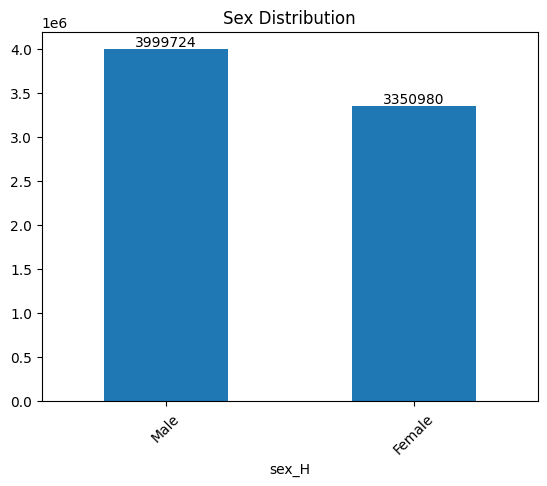

In [27]:
sex_plot = train['sex_H'].value_counts().plot(kind='bar')
plt.title('Sex Distribution')
plt.xticks(ticks=[0,1], labels=['Male', 'Female'], rotation=45)
plt.bar_label(sex_plot.containers[0], fmt=int)
plt.show()

In [28]:
# Defining function to plot column data and see product purchasing behavior
def plot_grouped_data(df, group_col, products, colormap='rainbow', title='Grouped Data', show_legend=True):
    dummy = df.groupby(group_col)[products].sum()
    dummy = (dummy/dummy.sum()).T
    ax = dummy.plot(kind='bar', stacked=True, colormap=colormap, figsize=(10,4))
    ax.set_title(title)

    if show_legend:
        plt.legend(loc='center left', title='Legend', bbox_to_anchor=(1, .4))
    else:
        plt.legend().set_visible(False)


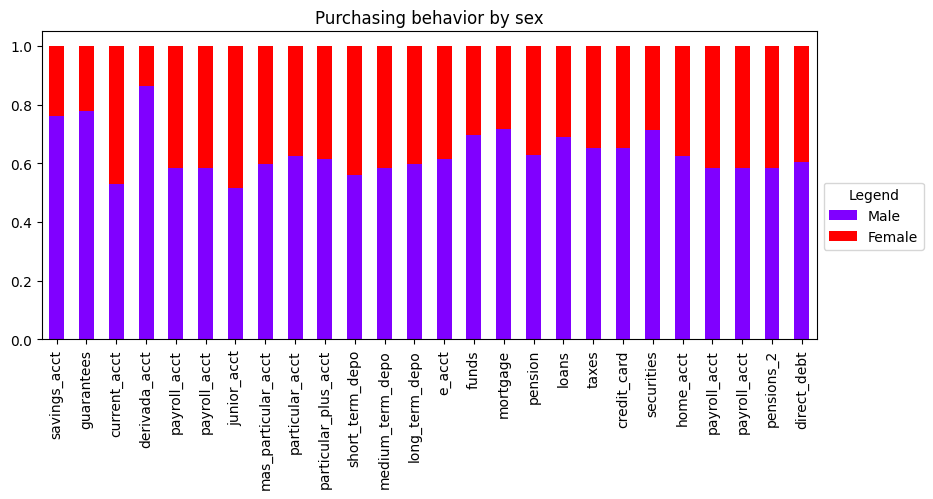

In [29]:
plot_grouped_data(train, 'sex_H', products, title='Purchasing behavior by sex', show_legend=True)
plt.legend(labels=('Male', 'Female'),loc='center left', title='Legend', bbox_to_anchor=(1, .4))
plt.show()

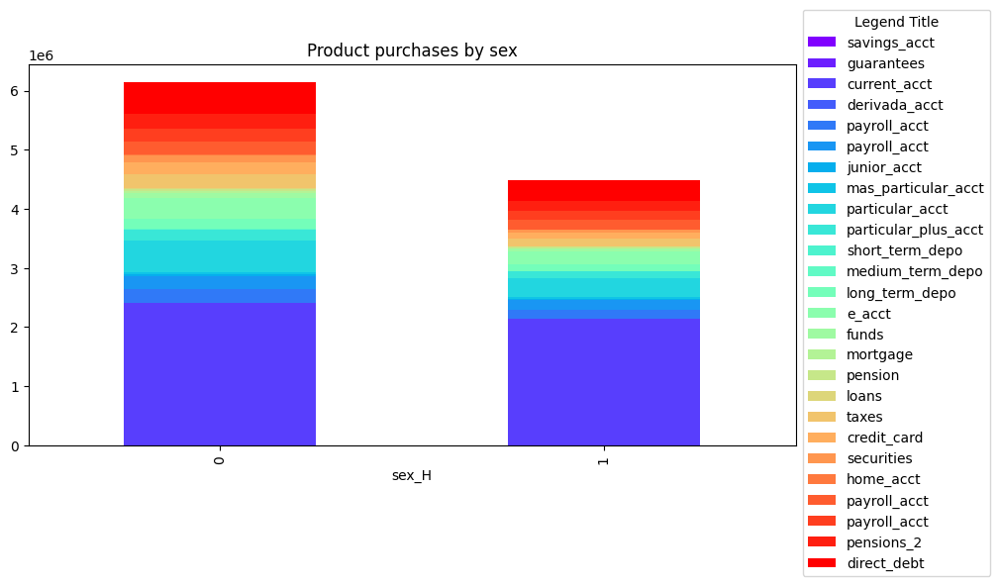

In [30]:
dummy = train[['sex_H']+products].groupby('sex_H').sum()
dummy.plot(kind='bar',stacked=True, colormap='rainbow',figsize=(10,5))
plt.legend(loc='center left', title='Legend Title', bbox_to_anchor=(1, .4))
plt.title('Product purchases by sex')
plt.show()

In [31]:
dummy

,savings_acct,guarantees,current_acct,derivada_acct,payroll_acct,payroll_acct,junior_acct,mas_particular_acct,particular_acct,particular_plus_acct,short_term_depo,medium_term_depo,long_term_depo,e_acct,funds,mortgage,pension,loans,taxes,credit_card,securities,home_acct,payroll_acct,payroll_acct,pensions_2,direct_debt
sex_H,,,,,,,,,,,,,,,,,,,,,,,,,,
0,497,102,2414549,2336,220587,220587,32881,39151,539598,177024,5383,6139,171891,351989,87573,28171,38962,11678,238128,196392,124336,16052,220587,220587,241036,535761
1,156,29,2136189,370,157492,157492,30972,26250,322787,111320,4250,4356,115044,221638,38402,11019,22917,5242,126293,104106,50063,9589,157492,157492,171607,349239


- We can see that the bank has more male customers and they have bought more products than female customers
- Male customers have bought most of the products, showing a skewed distribution in the total products bought
- All the products, except derivada account show a relative similar ratio to the amount of male anad female customers, showing that it there may not be a product preference when it comes to gender, and the difference comes from the number of customers  

### Analyzing column: Age

In [32]:
age_sex = train.groupby('sex_H')['age'].size()

C:\Users\MARIA\AppData\Local\Temp\ipykernel_10476\2932124040.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_sex_counts = train.groupby(['age_group', 'sex_H']).size().unstack(fill_value=0)


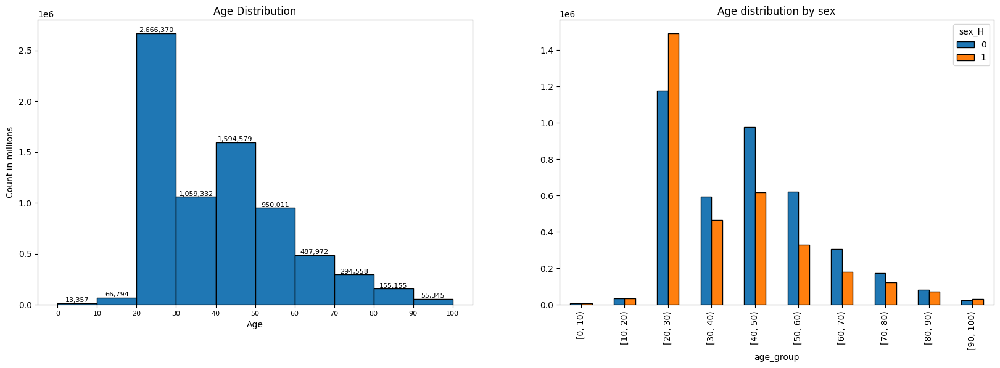

In [33]:
bin_edges = np.arange(0, 101, 10)
labels = [f'{i}-{i+19}' for i in bin_edges[:-1]]

# Create age groups
train['age_group'] = pd.cut(train['age'], bins=bin_edges, right=False)
age_sex_counts = train.groupby(['age_group', 'sex_H']).size().unstack(fill_value=0)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)

#Age Distribution
bin_edges = np.arange(0, 101, 10)
values, bins, bars = plt.hist(train['age'], bins=bin_edges, edgecolor = 'black')
plt.title('Age Distribution')
plt.ylabel('Count in millions')
plt.xlabel('Age')
plt.xticks(bin_edges, fontsize=8)
plt.bar_label(bars, fmt='{:,.0f}', fontsize=8)

#Age distribution by sex
plt.subplot(1,2,2)
age_sex_counts.plot(kind='bar', stacked=False, edgecolor='black', ax=plt.gca())
plt.title('Age distribution by sex')

plt.show()

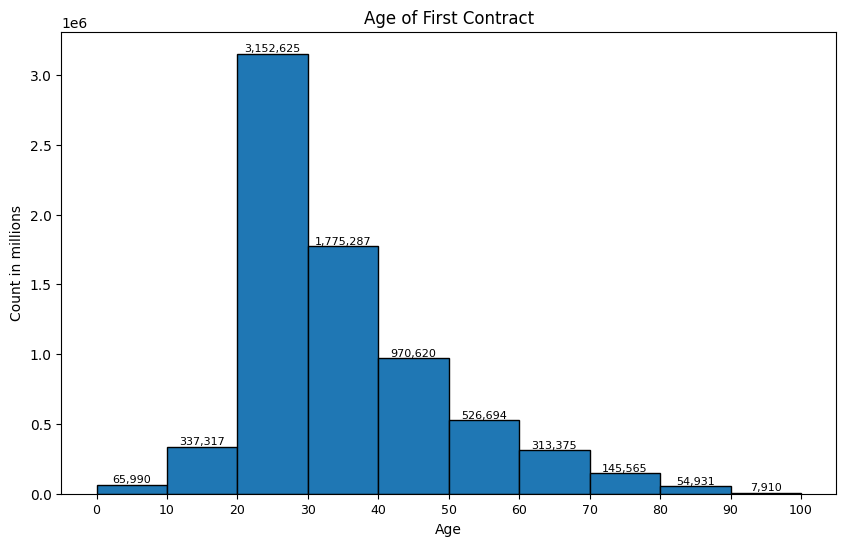

In [34]:
train['first_contract_age'] = train['age']-(train['seniority_in_months']/12).round()
test_set['first_contract_age'] = test_set['age']-(test_set['seniority_in_months']/12).round()
val_set['first_contract_age'] = val_set['age']-(val_set['seniority_in_months']/12).round()

bin_edges = np.arange(0, 101, 10)

plt.figure(figsize=(10,6))
values, bins, bars = plt.hist(train['first_contract_age'], bins=bin_edges, edgecolor = 'black')
plt.title('Age of First Contract')
plt.ylabel('Count in millions')
plt.xlabel('Age')
plt.xticks(bin_edges, fontsize=9)
plt.bar_label(bars, fmt='{:,.0f}', fontsize=8)
plt.show()

C:\Users\MARIA\AppData\Local\Temp\ipykernel_10476\2298204075.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dummy = train.groupby('age_group')[products].sum()
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite value

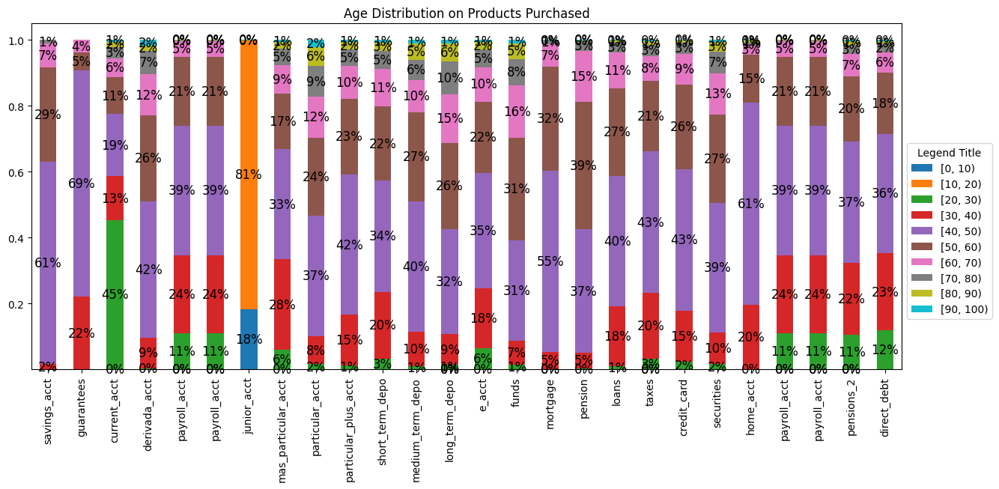

In [35]:
dummy = train.groupby('age_group')[products].sum()
dummy = (dummy/dummy.sum()).T
ax = dummy.plot(kind='bar', stacked=True, figsize=(15,6))
plt.legend(loc='center left', title='Legend Title', bbox_to_anchor=(1, .4))
plt.title('Age Distribution on Products Purchased')

for container in ax.containers:
    ax.bar_label(container, labels=[f'{v*100:.0f}%' for v in container.datavalues], label_type='center', fontsize=12)

plt.show()

In [36]:
dummy*100

age_group,"[0, 10)","[10, 20)","[20, 30)","[30, 40)","[40, 50)","[50, 60)","[60, 70)","[70, 80)","[80, 90)","[90, 100)"
savings_acct,0.000000,0.000000,0.000000,1.684533,61.255743,28.637060,7.350689,1.071975,0.000000,0.000000
guarantees,0.000000,0.000000,0.000000,22.137405,68.702290,5.343511,3.816794,0.000000,0.000000,0.000000
current_acct,0.000308,0.146629,45.165336,13.313117,18.856746,11.248619,5.710774,3.355063,1.686185,0.517224
derivada_acct,0.000000,0.000000,0.406504,9.164819,41.537324,25.979305,12.490761,7.132299,1.515152,1.773836
payroll_acct,0.000794,0.013225,11.077608,23.507614,39.421375,20.851220,4.780080,0.256831,0.072738,0.018515
payroll_acct,0.000794,0.013225,11.077608,23.507614,39.421375,20.851220,4.780080,0.256831,0.072738,0.018515
junior_acct,18.365621,81.419824,0.203593,0.010963,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
mas_particular_acct,0.000000,0.001529,5.898004,27.604557,33.360349,16.778041,8.792721,4.835232,2.110253,0.619313
particular_acct,0.000000,0.000116,1.631293,8.432069,36.683015,23.606139,12.407763,9.352581,5.743043,2.143981
particular_plus_acct,0.000000,0.000000,1.314570,15.400392,42.404262,23.107702,9.815551,5.029238,2.260242,0.668043


- There are more male than female customers in all age groups, except 90-100
- There is a large number of young customers, in the 20-30 range and the second largest group of clients are on the 40-50 age range
- Most clients buy their first product when they are in the age group of 20-30
- There is a clear difference in the age group signed up for the junior account -predominantly with clients in the 10-20 age range
- There is a good amount of variety base on age group and products bough. Product dominance usually interchanges between age groups 40-50 and 50-60, followed by 30-40   

### Analyzing column: New Customers

new_cust
0    6802900
1     547804
Name: count, dtype: int64


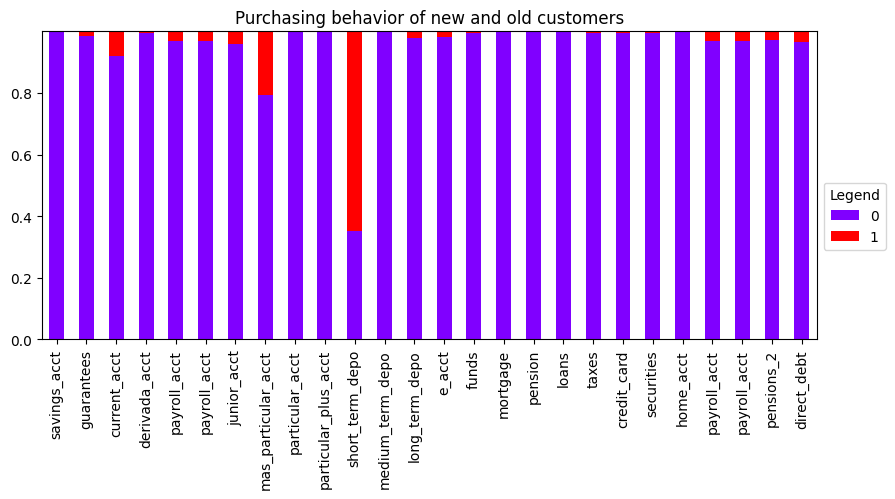

In [37]:
print(train['new_cust'].value_counts())

plot_grouped_data(train, 'new_cust', products, title='Purchasing behavior of new and old customers', show_legend=True)
plt.show()

- New customers purchase mostly short term deposits and mas particular account
- Very few participation on other products, meaning that few products offered by the bank are actually attracting new customers  

### Analyzing column: Seniority in Months

seniority_in_months
-999999        14
 0          94063
 1          92587
 2          89380
 3          89877
 4          83933
 5          88095
 6          79742
 7          78786
 8          75629
 9          73743
 10         84822
 11         67135
 12        104715
 13         77327
 14         80727
 15         77936
 16         79900
 17         78522
 18         75535
 19         69870
 20         69070
 21         81152
 22         72686
 23         77104
 24         80156
 25         70212
 26         73359
 27         69215
 28         68679
 29         66298
 30         64299
 31         61612
 32         58795
 33         66440
 34         61948
 35         63292
 36         72391
 37         64670
 38         66988
 39         63180
 40         66430
 41         64465
 42         59939
 43         65549
 44         63357
 45         66941
 46         63069
 47         58018
 48         61523
 49         56901
 50         57398
 51         52852
 52         56166
 53     

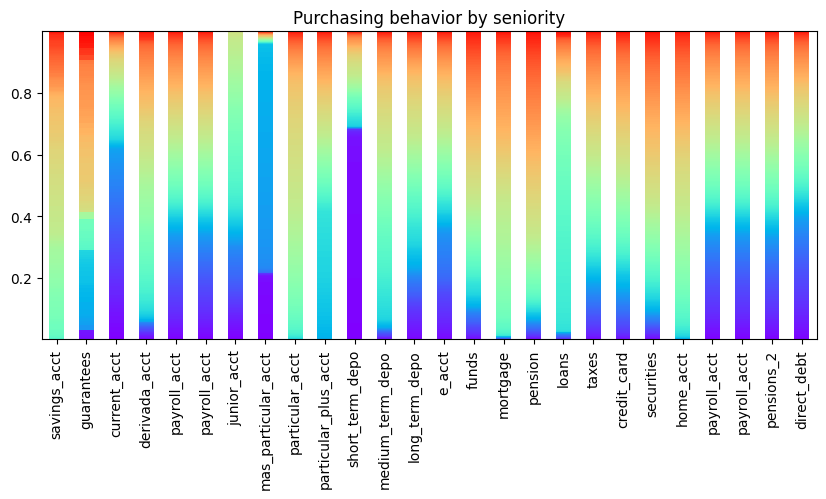

In [38]:
print(train['seniority_in_months'].value_counts().sort_index())

plot_grouped_data(train, 'seniority_in_months', products, title='Purchasing behavior by seniority', show_legend=False)
plt.show()

Cool colors indicate more recent clients and warm colors indicate higher seniority.  
For example: 0 months will be purple, converging to blue green, orange and finally red will be 256 months

- Current account, juniour account, mas account and short term account have the newest clients of the bank
- Oldest customers have bought savings, particular_plus account, mortgage, loans and home accounts  

### Analyzing column: Customer Type  
Correcting data type

In [39]:
train['cust_type'] = train['cust_type'].astype(str).str.strip()
test_set['cust_type'] = test_set['cust_type'].astype(str).str.strip()
val_set['cust_type'] = val_set['cust_type'].astype(str).str.strip()

train['cust_type'].unique()

array(['1', '1.0', '0', '3.0', '2', '3', 'P', '2.0', '4.0', '4'],
      dtype=object)

In [40]:
cust_type_map = {'0.0': '0', '1.0': '1', '2.0': '2', '3.0': '3', '4.0': '4'}
train['cust_type'] = train['cust_type'].replace(cust_type_map)

test_set['cust_type'] = test_set['cust_type'].replace(cust_type_map)
val_set['cust_type'] = val_set['cust_type'].replace(cust_type_map)

train['cust_type'] = train['cust_type'].astype(object)

test_set['cust_type'] = test_set['cust_type'].astype(object)
val_set['cust_type'] = val_set['cust_type'].astype(object)

print(train['cust_type'].value_counts())
print(train['cust_relationship'].value_counts())

cust_type
1    7260501
0      85390
3       3040
2        917
P        627
4        229
Name: count, dtype: int64
cust_relationship
I    4084146
A    3177272
0      85390
P       3269
R        623
N          4
Name: count, dtype: int64


Same number of NA (0) for both relationship and customer type

In [41]:
na_rel = train[train['cust_type'] == '0']
na_rel[products].sum().sort_values(ascending=False)

current_acct            48358
mas_particular_acct       962
direct_debt               426
short_term_depo           377
junior_acct               307
pensions_2                302
payroll_acct              297
payroll_acct              297
payroll_acct              297
payroll_acct              297
long_term_depo            169
e_acct                     49
securities                 15
taxes                       6
funds                       5
credit_card                 2
pension                     1
derivada_acct               1
medium_term_depo            0
guarantees                  0
mortgage                    0
loans                       0
home_acct                   0
particular_plus_acct        0
particular_acct             0
savings_acct                0
dtype: int64

In [42]:
train['total_products'].groupby(train['cust_type']).sum()

cust_type
0       52168
1    10578826
2         434
3        1781
4         163
P         411
Name: total_products, dtype: int64

In [43]:
dummy = train.groupby('cust_type')[products].sum()
dummy = (dummy/dummy.sum()).T

print((dummy*100).round(2))

cust_type                0       1     2     3     4     P
savings_acct          0.00  100.00  0.00  0.00  0.00  0.00
guarantees            0.00  100.00  0.00  0.00  0.00  0.00
current_acct          1.06   98.89  0.00  0.03  0.00  0.01
derivada_acct         0.04   99.96  0.00  0.00  0.00  0.00
payroll_acct          0.08   99.92  0.00  0.00  0.00  0.00
payroll_acct          0.08   99.92  0.00  0.00  0.00  0.00
junior_acct           0.48   99.51  0.00  0.00  0.00  0.00
mas_particular_acct   1.47   97.96  0.04  0.42  0.03  0.07
particular_acct       0.00  100.00  0.00  0.00  0.00  0.00
particular_plus_acct  0.00  100.00  0.00  0.00  0.00  0.00
short_term_depo       3.91   95.11  0.09  0.67  0.09  0.11
medium_term_depo      0.00  100.00  0.00  0.00  0.00  0.00
long_term_depo        0.06   99.90  0.03  0.01  0.00  0.00
e_acct                0.01   99.99  0.00  0.00  0.00  0.00
funds                 0.00   99.99  0.00  0.00  0.00  0.00
mortgage              0.00  100.00  0.00  0.00  0.00  0.

- Customers with type and relationship missing have bought mostly current account, mas particular account and short term deposit. These are likely new customers
- Customers with type 2, 3 and P have bought mostly mas particular account and short term deposit accounts  

### Analyzing column: Join Channel

In [44]:
train['join_channel'].value_counts()

join_channel
KHE      2095903
KAT      1709503
KFC      1655057
KHQ       413265
KFA       213305
KHK       137531
KHM       128004
other     110709
KHN        79888
KHD        61353
KAS        45889
RED        41080
KAG        38692
KAY        36402
KAA        35588
KAB        33183
KAE        27195
KCC        25857
KHL        24952
KBZ        24655
KFD        24092
KAI        20258
KEY        18691
KAW        18073
KAR        17711
KAZ        17615
007        16861
KAF        15964
KCI        14619
013        13763
KAJ        13605
KCH        13494
KAH        13086
KHF        11475
KAQ         9796
KHC         9096
KAP         8306
KHO         6171
KAM         6106
KAD         5467
KEJ         5200
KGX         5179
KFP         5164
KGV         4788
KFT         4528
KDR         4437
KAL         4202
KBO         4072
KAC         4038
KBH         3920
KFS         3884
KFJ         3748
KAO         3715
KFG         3692
KES         3096
KFF         3026
KEW         2951
KCG         2815
K

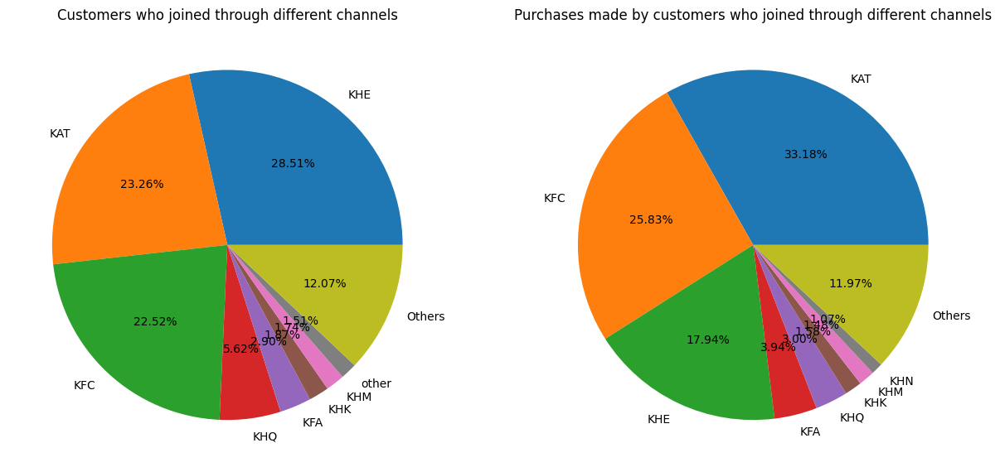

In [45]:
channel = train['join_channel'].value_counts()[:8]
others = train['join_channel'].value_counts()[8:]
dummy = train.groupby('join_channel')[products].sum().sum(axis=1)
dummy = dummy.sort_values(ascending=False)

plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
plt.pie(list(channel)+[others.sum()], labels=list(channel.index)+['Others'], autopct='%1.2f%%')
plt.title('Customers who joined through different channels')
plt.subplot(1,2,2)
plt.pie(list(dummy.values[:8])+[dummy.values[8:].sum()], labels = list(dummy.index[:8])+['Others'], autopct='%1.2f%%')
plt.title('Purchases made by customers who joined through different channels')
plt.show()

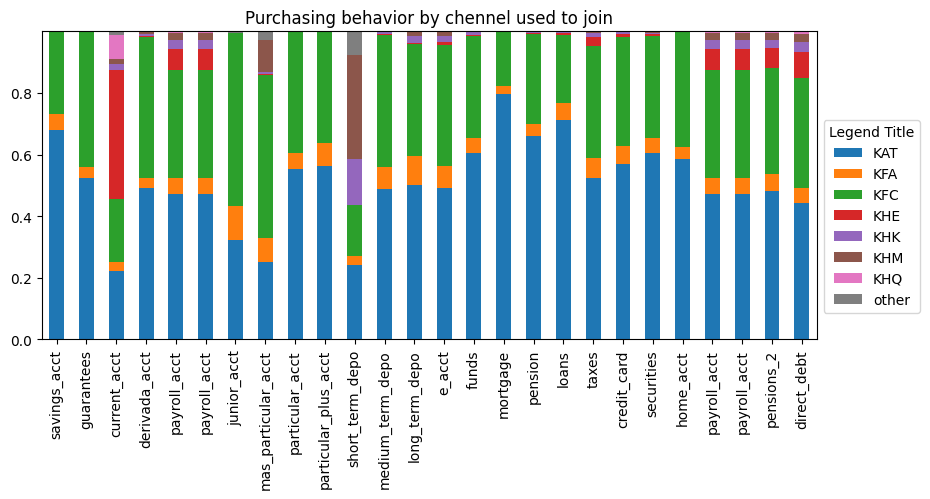

In [46]:
dummy = train.groupby('join_channel')[products].sum()
dummy = dummy[dummy.index.isin(channel.keys())]
dummy = (dummy/dummy.sum()).T
dummy.plot(kind='bar',stacked=True, figsize=(10,4))
plt.legend(loc='center left', title='Legend Title', bbox_to_anchor=(1, .4))
plt.title('Purchasing behavior by chennel used to join')
plt.show()

- The 8 top channels used to join the bank make up 88% of the total customers
- When we compare the number of purchases made by clients with to the channel they joined, 7 out of 8 channels are repeated on the number of clients who joined and number of purchases made, with the exception of "others" which were missing values
- Customers who joined through KAT have most purchases
- Customers who joined through KFC have more purchased than KAT on mas particular account and junior account  

### Analyzing column: Province Name

In [47]:
train['province_name'].value_counts().head(10)

province_name
MADRID       2374509
BARCELONA     703041
VALENCIA      374474
SEVILLA       321534
CORUÑA, A     229212
MURCIA        213652
MALAGA        194405
ZARAGOZA      184413
ALICANTE      171465
CADIZ         156627
Name: count, dtype: int64

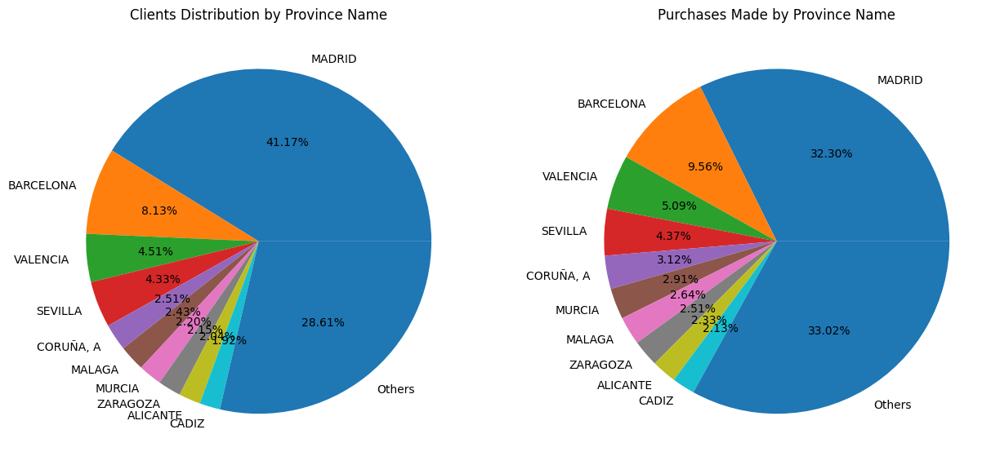

In [48]:
top_province = train['province_name'].value_counts()[:10]
province_others = train['province_name'].value_counts()[10:]
dummy = train.groupby('province_name')[products].sum().sum(axis=1)
dummy = dummy.sort_values(ascending=False)

plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
plt.pie(list(dummy.values[:10])+[dummy.values[10:].sum()], labels = list(dummy.index[:10])+['Others'], autopct='%1.2f%%')
plt.title('Clients Distribution by Province Name')
plt.subplot(1,2,2)
plt.pie(list(top_province)+[province_others.sum()], labels=list(top_province.index)+['Others'], autopct='%1.2f%%')
plt.title('Purchases Made by Province Name')
plt.show()

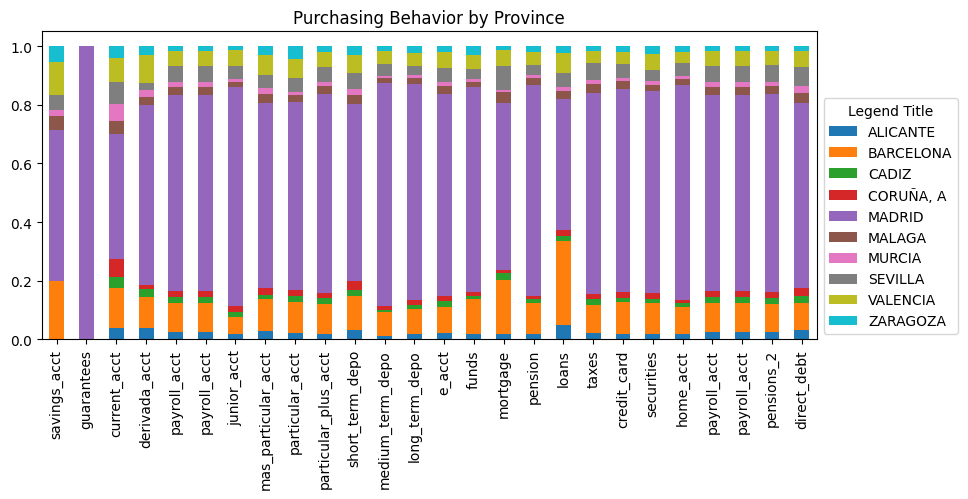

In [49]:
dummy = train.groupby('province_name')[products].sum()
dummy = dummy[dummy.index.isin(top_province.keys())]
dummy = (dummy/dummy.sum()).T
dummy.plot(kind='bar',stacked=True, figsize=(10,4))
plt.legend(loc='center left', title='Legend Title', bbox_to_anchor=(1, .4))
plt.title('Purchasing Behavior by Province')
plt.show()

- We can see most of the clients are from Madrid, Spain's capital, followed by other cities like Barcelona, Valencia and Sevilla
- The distribution of number products bought is quite similar to the number of clients from each city
- Guarantees account have only Madrid clients
- Clients from Barcelona buys mostly loans and savings account  

### Analyzing column: Active Customer

active_cust
0    4171818
1    3178886
Name: count, dtype: int64


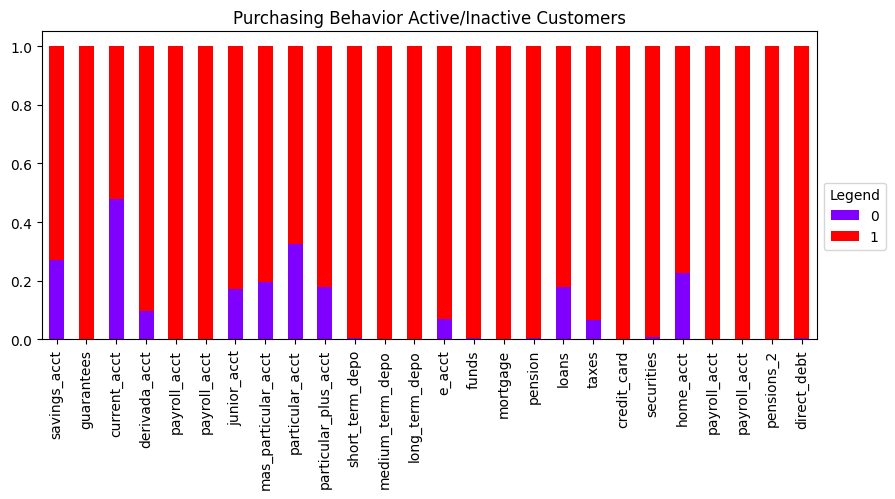

In [50]:
print(train['active_cust'].value_counts())

plot_grouped_data(train, 'active_cust', products, title='Purchasing Behavior Active/Inactive Customers', show_legend=True)
plt.show()

- There is a lot of inactive customers on the dataset, however all products have more active than inactive customers
- The three products with most inactive customers are savings, current and particular account  

### Analyzing column: Income

In [51]:
(train['income'] == 0).sum()

1566917

In [52]:
train.groupby('province_name')['income'].describe().round()

,count,mean,std,min,25%,50%,75%,max
province_name,,,,,,,,
ALAVA,20457.0,131.0,4213.0,0.0,0.0,0.0,0.0,253563.0
ALBACETE,61597.0,70692.0,45598.0,0.0,43643.0,72158.0,97240.0,764582.0
ALICANTE,171465.0,64526.0,142980.0,0.0,0.0,51896.0,86986.0,17804048.0
ALMERIA,32964.0,65368.0,57020.0,0.0,27816.0,61371.0,89659.0,578349.0
ASTURIAS,142752.0,75717.0,86326.0,0.0,0.0,73111.0,103932.0,4950059.0
AVILA,20854.0,60446.0,71181.0,0.0,33132.0,59390.0,82089.0,2768593.0
BADAJOZ,102555.0,56180.0,48798.0,0.0,23238.0,52291.0,79828.0,1103543.0
"BALEARS, ILLES",69624.0,94224.0,374586.0,0.0,0.0,63926.0,130273.0,15711716.0
BARCELONA,703041.0,137804.0,151217.0,0.0,67883.0,115102.0,173602.0,5752268.0


- Median income of the customers of all the products is almost same
- We can see gross house hold income of Ceuta is the highest

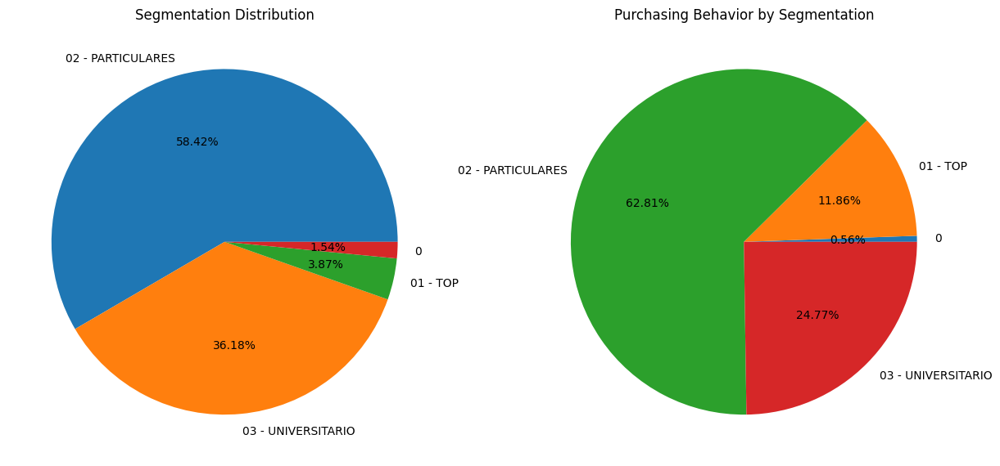

In [53]:
segmentation = train['segment'].value_counts()
seg_products = train.groupby('segment')['total_products'].sum()
seg_products = (seg_products/seg_products.sum())*100
seg_products

plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
plt.pie(segmentation, labels=segmentation.keys(), autopct='%1.2f%%')
plt.title('Segmentation Distribution')
plt.subplot(1,2,2)
plt.pie(seg_products, labels=seg_products.index, autopct='%1.2f%%')
plt.title('Purchasing Behavior by Segmentation')
plt.show()

segment
02 - PARTICULARES     4293981
03 - UNIVERSITARIO    2659297
01 - TOP               284472
0                      112954
Name: count, dtype: int64


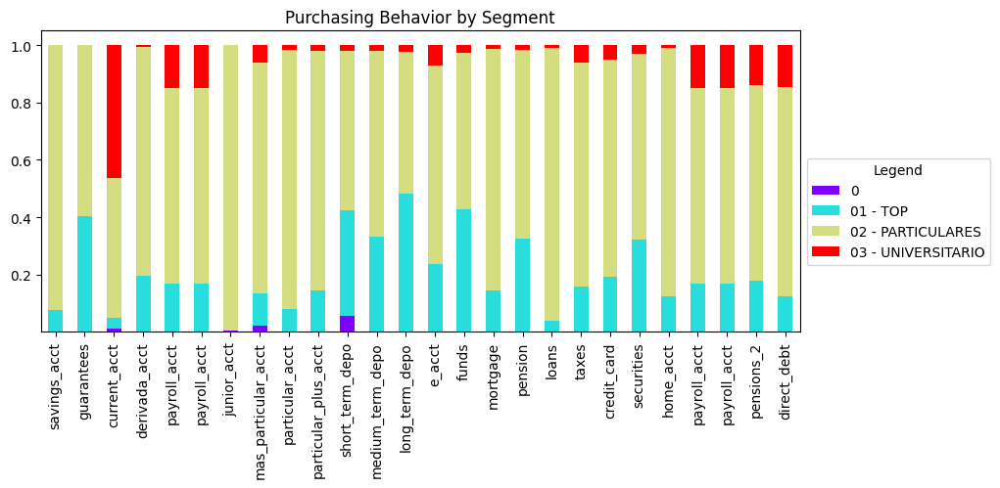

In [54]:
print(train['segment'].value_counts())

plot_grouped_data(train, 'segment', products, title='Purchasing Behavior by Segment', show_legend=True)
plt.show()

- Most customers are from segment #2 - Particulares
- The count of clients on each segment is corrrelated with the products the customers of that segments have bought
- All the customers who have bought juniour account belong to segment 02  

### Count of All Products Sold

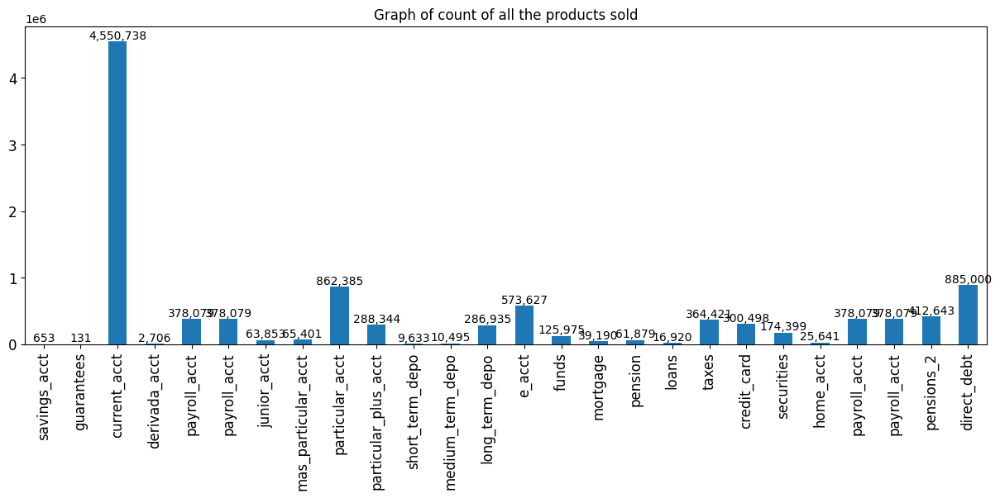

In [55]:
ax = train[products].sum().plot(kind='bar', figsize=(15, 5), fontsize=12)
plt.title('Graph of count of all the products sold')
for container in ax.containers:
    ax.bar_label(container, fmt='{:,.0f}')
# plt.xticks(rotation = 45)
plt.show()

- Current account, particular, direct debit and e_account are the most popular accounts.
- Savings account, guarentees, derivada account, short and medium term deposits are the least popular accounts

# Make Data Model Ready

In [56]:
train = train.rename(columns={'sex_H': 'female'})
val_set = val_set.rename(columns={'sex_H': 'female'})
test_set = test_set.rename(columns={'sex_H': 'female'})

## Data Processing  
The first problem we identified was: Non-primary and deceased are only 0.2% of the dataset which imbalances the dataset and may not produce significant results, so we decided to drop them.  
In addition to that, since we will be working only with primary customers, the column last_date_primary is not helpful anymore, so we will drop it as well.  

In [57]:
#Dropping rows with primary_cust == 99
train = train[train['primary_cust'] != 99]
test_set = test_set[test_set['primary_cust'] != 99]
val_set = val_set[val_set['primary_cust'] != 99]

print((train['primary_cust'] == 99).value_counts())

primary_cust
False    7336142
Name: count, dtype: int64


Deceased clients have a few products, but they are not going to buy any more products -which is not valuable to our ultimate goal of predicting which products clients will buy, so we will drop the rows of deceased clients and drop the column

In [58]:
#Dropping rows with deceased == 1
# train = train[train['deceased'] == 0]
# test_set = test_set[test_set['deceased'] == 0]
# val_set = val_set[val_set['deceased'] == 0]

print((train['deceased'] == 1).value_counts())
print((test_set['deceased'] == 1).value_counts())
print((val_set['deceased'] == 1).value_counts())

deceased
False    7336142
Name: count, dtype: int64
deceased
False    1571978
Name: count, dtype: int64
deceased
False    1572033
Name: count, dtype: int64


We will drop columns where age is 0 and over 100. We believe these clients are not going to be valuable on our model

In [59]:
print(((train['age'] == 0) | (train['age'] > 100)).value_counts())

age
False    7328925
True        7217
Name: count, dtype: int64


In [60]:
train = train[(train['age'] > 0) & (train['age'] <= 100)]
test_set = test_set[(test_set['age'] > 0) & (test_set['age'] <= 100)]
val_set = val_set[(val_set['age'] > 0) & (val_set['age'] <= 100)]

print(((train['age'] == 0) | (train['age'] > 100)).value_counts())

age
False    7328925
Name: count, dtype: int64


We will drop the rows on column seniority_in_months with values -999999 and null values under province_name (that were previously filled up with 'other') since those variables cause some noise on the data

In [61]:
train = train[train['seniority_in_months'] != -999999]
train = train[train['province_name'] != 'other']

test_set = test_set[test_set['seniority_in_months'] != -999999]
test_set = test_set[test_set['province_name'] != 'other']

val_set = val_set[val_set['seniority_in_months'] != -999999]
val_set = val_set[val_set['province_name'] != 'other']

We had the impression the columns seniority in months and first contract date were giving us the same information and we decided to check the correlation. Turns out it is highly correlated, so we'll keep the column seniority in months.

In [62]:
correlation = train[['seniority_in_months', 'first_contract_date']].corr()
correlation

,seniority_in_months,first_contract_date
seniority_in_months,1.000000,-0.965954
first_contract_date,-0.965954,1.000000


Dropping primary_customer , last_date_primary, deceased and first_contract_date columns since after cleaning the dataset, they do not provide any additional information

In [63]:
train = train.drop(columns=['primary_cust', 'last_date_primary', 'deceased', 'first_contract_date'])
test_set = test_set.drop(columns=['primary_cust', 'last_date_primary', 'deceased', 'first_contract_date'])
val_set = val_set.drop(columns=['primary_cust', 'last_date_primary', 'deceased', 'first_contract_date'])

In [64]:
(train['income'] == 0).value_counts()

income
False    5772084
True     1523888
Name: count, dtype: int64

There is a lot of missing values for the income variable. We checked if it makes sense for us to fill those missing incomes with the median income per province, however we still got too many null values, so we will drop the income = 0 rows

In [65]:
train = train[train['income'] != 0]
test_set = test_set[test_set['income'] != 0]
val_set = val_set[val_set['income'] != 0]

print(train.shape)
print(test_set.shape)
print(val_set.shape)

(5772084, 44)
(1236744, 43)
(1236546, 43)


In [66]:
train.isnull().sum()

date                       0
customer_code              0
employee_index             0
country                    0
female                     0
age                        0
new_cust                   0
seniority_in_months        0
cust_type                  0
cust_relationship          0
residency_spain            0
birth_spain                0
join_channel               0
province_name              0
active_cust                0
income                     0
segment                    0
savings_acct               0
guarantees                 0
current_acct               0
derivada_acct              0
payroll_acct               0
junior_acct                0
mas_particular_acct        0
particular_acct            0
particular_plus_acct       0
short_term_depo            0
medium_term_depo           0
long_term_depo             0
e_acct                     0
funds                      0
mortgage                   0
pension                    0
loans                      0
taxes         

In [67]:
# Checking unique variables for cust_type
print(train['cust_type'].unique())
print(train['cust_type'].isna().sum())

['1' '0' '2' '3' 'P' '4']
0


In [68]:
# Fixing cust_type variables so they are consistent across rows
train['cust_type'] = train['cust_type'].astype(str).str.strip()
cust_type_map = {'0.0': '0', '1.0': '1', '2.0': '2', '3.0': '3', '4.0': '4'}
train['cust_type'] = train['cust_type'].replace(cust_type_map)

test_set['cust_type'] = test_set['cust_type'].astype(str).str.strip()
test_set['cust_type'] = test_set['cust_type'].replace(cust_type_map)

val_set['cust_type'] = val_set['cust_type'].astype(str).str.strip()
val_set['cust_type'] = val_set['cust_type'].replace(cust_type_map)

train['cust_type'] = train['cust_type'].astype(object)
test_set['cust_type'] = test_set['cust_type'].astype(object)
val_set['cust_type'] = val_set['cust_type'].astype(object)

print(train['cust_type'].value_counts())
print(train['cust_relationship'].value_counts())

cust_type
1    5748876
0      22238
3        642
2        165
P        122
4         41
Name: count, dtype: int64
cust_relationship
I    3202187
A    2546854
0      22238
P        683
R        122
Name: count, dtype: int64


In [69]:
train.describe().round(2)
#Check for 0s, outliers - that are too different from the 4th quartile

,date,customer_code,age,new_cust,seniority_in_months,active_cust,income,savings_acct,guarantees,current_acct,derivada_acct,payroll_acct,junior_acct,mas_particular_acct,particular_acct,particular_plus_acct,short_term_depo,medium_term_depo,long_term_depo,e_acct,funds,mortgage,pension,loans,taxes,credit_card,securities,home_acct,payroll_acct,pensions_2,direct_debt,total_products,first_contract_age
count,5772084,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.0,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00,5772084.00
mean,2015-12-16 16:01:43.477912832,811258.77,40.77,0.03,83.32,0.44,134132.78,0.00,0.0,0.62,0.00,0.06,0.01,0.01,0.13,0.04,0.00,0.00,0.04,0.09,0.02,0.01,0.01,0.00,0.06,0.05,0.03,0.00,0.06,0.06,0.13,1.52,33.83
min,2015-06-28 00:00:00,15889.00,2.00,0.00,0.00,0.00,1202.73,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-9.00
25%,2015-09-28 00:00:00,435897.50,25.00,0.00,26.00,0.00,68564.01,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,22.00
50%,2015-12-28 00:00:00,907045.00,40.00,0.00,54.00,0.00,101606.49,0.00,0.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,30.00
75%,2016-03-28 00:00:00,1180245.00,51.00,0.00,140.00,1.00,155661.81,0.00,0.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,41.00
max,2016-05-28 00:00:00,1454620.00,100.00,1.00,256.00,1.00,28894395.51,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,17.00,100.00
std,NaN,424061.32,17.18,0.18,66.35,0.50,232839.51,0.01,0.0,0.49,0.02,0.23,0.10,0.09,0.33,0.20,0.04,0.04,0.20,0.28,0.14,0.08,0.10,0.05,0.23,0.21,0.16,0.06,0.23,0.24,0.34,1.89,14.61


Plotting outliers

In [70]:
# Create a variable with numerical columns to plot them easier
numeric_col = train.select_dtypes(include=['int', 'float']).columns.tolist()
numeric_col = [col for col in numeric_col if col not in products]
numeric_col

['customer_code',
 'age',
 'new_cust',
 'seniority_in_months',
 'active_cust',
 'income',
 'total_products',
 'first_contract_age']

In [71]:
# dummy = pd.DataFrame(columns=['age', 'seniority_in_months', 'income', 'product'])

# for col in products:
#     df = pd.DataFrame({
#         'age': train.age[train[col] == 1],
#         'seniority_in_months': train.seniority_in_months[train[col] == 1],
#         'income': np.log1p(train.income[train[col] == 1]),
#         'product': col
#     })
    
# dummy = pd.concat([dummy, df], ignore_index=True)

In [72]:
# plt.figure(figsize=(15, 18))

# # Plot for Age
# plt.subplot(3, 1, 1)
# sns.boxplot(data=dummy, x='product', y='age', palette='rainbow')
# plt.title('Distribution of Age by Product')
# plt.xticks(rotation=90)

# # Plot for Seniority in Months
# plt.subplot(3, 1, 2)
# sns.boxplot(data=dummy, x='product', y='seniority_in_months', palette='rainbow')
# plt.title('Distribution of Seniority in Months by Product')
# plt.xticks(rotation=90)

# # Plot for Income
# plt.subplot(3, 1, 3)
# sns.boxplot(data=dummy, x='product', y='income', palette='rainbow')
# plt.title('Distribution of Log Income by Product')
# plt.xticks(rotation=90)

# plt.tight_layout()
# plt.show()

Text(0.5, 1.0, 'Income (log) Distribution')

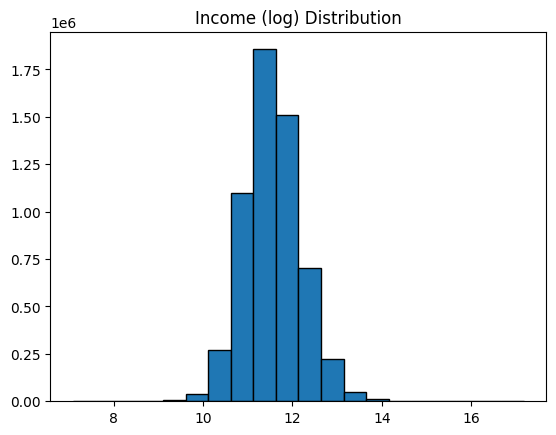

In [73]:
plt.hist(np.log(train['income']), bins=20, edgecolor='black')
plt.title('Income (log) Distribution')

Text(0.5, 1.0, 'Age Distribution')

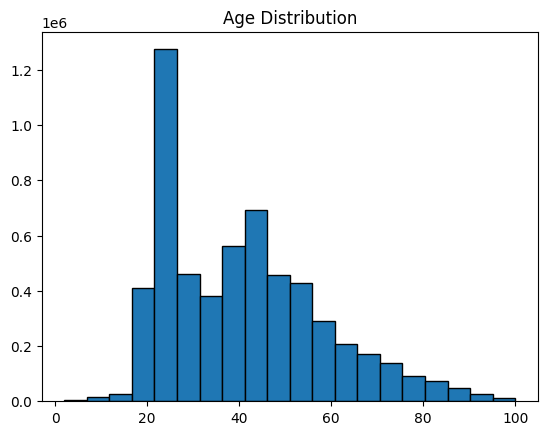

In [74]:
plt.hist(train['age'], bins=20, edgecolor='black')
plt.title('Age Distribution')

Transform categorical variables with label encoder to plot correlation. This will not be a final transformation, it is just to detect correlation

In [75]:
le = LabelEncoder()

correlation = train.copy()

columns_to_encode = ['employee_index', 'country', 'cust_type', 'cust_relationship', 
                     'join_channel', 'province_name', 'segment']

for col in columns_to_encode:
    correlation[col] = le.fit_transform(correlation[col])

In [76]:
# plt.figure(figsize=(25,15))
# sns.heatmap(correlation.corr(),annot=True, cmap="YlGnBu", fmt= '.2f')
# plt.show()

There are two correlations that draw attention to us. The first one is active_cust and cust_relationship, which is 0.81. The second one is payroll_acct and payroll_acct.1 which is 1. They will both be dropped, the payroll_acct.1 gives us the same information as the payroll_acct and we believe that having such a high correlation between active_cust and cust_relationship would hinder our model

## Dealing with the categorical values  
Since most of the data is from clients that comes from Spain, we will combine non-spanish clients into an "others" group so we will have only two variables: ES and others. After that we will transform the column in a dummy variable for Spain.

In [77]:
train['country'] = np.where(train['country'] == 'ES', 1, 0)
test_set['country'] = np.where(test_set['country'] == 'ES', 1, 0)
val_set['country'] = np.where(val_set['country'] == 'ES', 1, 0)

We will transform the segment column using get_dummies to create two different binary columns for the variables

In [78]:
segment_dummy = pd.get_dummies(train['segment'],drop_first=True)
train = pd.concat([train, segment_dummy], axis=1)

segment_dummy_test = pd.get_dummies(test_set['segment'],drop_first=True)
test_set = pd.concat([test_set, segment_dummy_test], axis=1)

segment_dummy_val = pd.get_dummies(val_set['segment'],drop_first=True)
val_set = pd.concat([val_set, segment_dummy_val], axis=1)

Since total_products is a continuous variable representing how many products each customer has purchased, we will use it as a target for encoding the categorical variables join_channel and province_name, since those have many different variables. We chose target encoding because we would have a dimensionality problem if we chose to transform each variable in a dummy column, and we did not want to use label encoder since it is not an ordinal variable

In [79]:
target_encoder = ce.TargetEncoder(cols=['join_channel', 'province_name', 'employee_index'])

train[['join_channel_encoded', 'province_name_encoded', 'employee_index_encoded']] = target_encoder.fit_transform(
    train[['join_channel', 'province_name', 'employee_index']], train['total_products'])

# Apply the same transformation to the test and validation set (use transform, not fit_transform)
test_set[['join_channel_encoded', 'province_name_encoded', 'employee_index_encoded']] = target_encoder.transform(
    test_set[['join_channel', 'province_name', 'employee_index']])

val_set[['join_channel_encoded', 'province_name_encoded', 'employee_index_encoded']] = target_encoder.transform(
    val_set[['join_channel', 'province_name', 'employee_index']])

# You can now inspect the transformed columns in test and val_set
print(test_set[['join_channel', 'province_name', 'join_channel_encoded', 'province_name_encoded', 'employee_index_encoded']].head())
print(val_set[['join_channel', 'province_name', 'join_channel_encoded', 'province_name_encoded', 'employee_index_encoded']].head())
print(train[['join_channel', 'province_name', 'join_channel_encoded', 'province_name_encoded', 'employee_index_encoded']].head())

       join_channel province_name  join_channel_encoded  \
70935           KAT     TARRAGONA              2.131292   
90608           KHE     CORUÑA, A              0.909825   
286157          KHK        MALAGA              1.268794   
361018          KHQ        BURGOS              0.868212   
13108           KHE     CASTELLON              0.909825   

        province_name_encoded  employee_index_encoded  
70935                1.257727                1.519747  
90608                1.189736                1.519747  
286157               1.358065                1.519747  
361018               1.302032                1.519747  
13108                1.302684                1.519747  
       join_channel province_name  join_channel_encoded  \
218355          KAF       SEVILLA              2.191395   
255866          KAT        MADRID              2.131292   
117532          KHE      ZARAGOZA              0.909825   
280037          KAT        MADRID              2.131292   
19770         

In [80]:
train['cust_type'] = train['cust_type'].replace({"P": 5})
train['cust_type'] = train['cust_type'].astype(int)

test_set['cust_type'] = test_set['cust_type'].replace({"P": 5})
test_set['cust_type'] = test_set['cust_type'].astype(int)

val_set['cust_type'] = val_set['cust_type'].replace({"P": 5})
val_set['cust_type'] = val_set['cust_type'].astype(int)

Normalization/Standartization of data  
We will normalize data for age and seniority in months since it is not normally distributed  
We will standardize income since its log is normally distributed 

In [81]:
# Normalize using MinMaxScaler on training data
cols_to_normalize = ['age', 'seniority_in_months']
min_max_scaler = MinMaxScaler(feature_range=(0, 1))
train[cols_to_normalize] = min_max_scaler.fit_transform(train[cols_to_normalize])
# Apply the fitted MinMaxScaler to test and validation sets
test_set[cols_to_normalize] = min_max_scaler.transform(test_set[cols_to_normalize])
val_set[cols_to_normalize] = min_max_scaler.transform(val_set[cols_to_normalize])

# Standardize using StandardScaler on training data
cols_to_standardize = ['income']
standard_scaler = StandardScaler()
train[cols_to_standardize] = standard_scaler.fit_transform(train[cols_to_standardize])
# Apply the fitted StandardScaler to test and validation sets
test_set[cols_to_standardize] = standard_scaler.transform(test_set[cols_to_standardize])
val_set[cols_to_standardize] = standard_scaler.transform(val_set[cols_to_standardize])

# Output results to verify
print("Training data (normalized):\n", train[cols_to_normalize].head())
print("Training data (standardized):\n", train[cols_to_standardize].head())

print("Test data (normalized):\n", test_set[cols_to_normalize].head())
print("Test data (standardized):\n", test_set[cols_to_standardize].head())

print("Validation data (normalized):\n", val_set[cols_to_normalize].head())
print("Validation data (standardized):\n", val_set[cols_to_standardize].head())


Training data (normalized):
              age  seniority_in_months
207640  0.234694             0.070312
116039  0.234694             0.140625
300836  0.306122             0.300781
361717  0.489796             0.644531
102962  0.224490             0.210938
Training data (standardized):
           income
207640  2.498775
116039 -0.208421
300836 -0.292548
361717 -0.209325
102962  0.419622
Test data (normalized):
              age  seniority_in_months
70935   0.734694             0.785156
90608   0.214286             0.113281
286157  0.244898             0.011719
361018  0.183673             0.023438
13108   0.234694             0.156250
Test data (standardized):
           income
70935  -0.374282
90608  -0.171172
286157 -0.358730
361018 -0.094848
13108  -0.354137
Validation data (normalized):
              age  seniority_in_months
218355  0.418367             0.527344
255866  0.377551             0.484375
117532  0.234694             0.199219
280037  0.755102             0.902344
19770  

# Feature Engineering

In [82]:
# Convert all boolean columns (True/False) to integers (1/0)
train = train.map(lambda x: int(x) if isinstance(x, bool) else x)

In [83]:
test_set = test_set.map(lambda x: int(x) if isinstance(x, bool) else x)

In [84]:
val_set = val_set.map(lambda x: int(x) if isinstance(x, bool) else x)

In [85]:
# Display the first few rows to check the changes
print(train.head())
print(test_set.head())
print(val_set.head())

             date  customer_code employee_index  country female       age  \
207640 2016-04-28        1334092              N        1      0  0.234694   
116039 2015-07-28        1024586              N        1      0  0.234694   
300836 2016-04-28         856204              N        1      0  0.306122   
361717 2015-08-28         295807              N        1      0  0.489796   
102962 2016-03-28         942624              N        1      1  0.224490   

        new_cust  seniority_in_months  cust_type cust_relationship  \
207640         0             0.070312          1                 I   
116039         0             0.140625          1                 A   
300836         0             0.300781          1                 I   
361717         0             0.644531          1                 A   
102962         0             0.210938          1                 I   

       residency_spain birth_spain join_channel province_name  active_cust  \
207640               1           0    

In [86]:
train = train.rename(columns={'country': 'country_spain'})
test_set = test_set.rename(columns={'country': 'country_spain'})
val_set = val_set.rename(columns={'country': 'country_spain'})

In [87]:
print(train.shape)
print(train.columns)
print(test_set.shape)
print(test_set.columns)
print(val_set.shape)
print(val_set.columns)

(5772084, 50)
Index(['date', 'customer_code', 'employee_index', 'country_spain', 'female',
       'age', 'new_cust', 'seniority_in_months', 'cust_type',
       'cust_relationship', 'residency_spain', 'birth_spain', 'join_channel',
       'province_name', 'active_cust', 'income', 'segment', 'savings_acct',
       'guarantees', 'current_acct', 'derivada_acct', 'payroll_acct',
       'junior_acct', 'mas_particular_acct', 'particular_acct',
       'particular_plus_acct', 'short_term_depo', 'medium_term_depo',
       'long_term_depo', 'e_acct', 'funds', 'mortgage', 'pension', 'loans',
       'taxes', 'credit_card', 'securities', 'home_acct', 'payroll_acct',
       'pensions_2', 'direct_debt', 'total_products', 'age_group',
       'first_contract_age', '01 - TOP', '02 - PARTICULARES',
       '03 - UNIVERSITARIO', 'join_channel_encoded', 'province_name_encoded',
       'employee_index_encoded'],
      dtype='object')
(1236744, 49)
Index(['date', 'customer_code', 'employee_index', 'country_spa

# New variables

Income to Age Ratio: This metric helps identify customers who might have high disposable income.

In [ ]:
# 2. Income to Age Ratio
train['income_to_age'] = train['income'] / (train['age'] + 1e-5)  # Avoid division by zero
train['income_to_age']

val_set['income_to_age'] = val_set['income'] / (val_set['age'] + 1e-5)  # Avoid division by zero
val_set['income_to_age']

test_set['income_to_age'] = test_set['income'] / (test_set['age'] + 1e-5)  # Avoid division by zero
test_set['income_to_age']

# Modeling approach

In [ ]:
# train.head()

In [ ]:
# val_set.head()

In [ ]:
# test_set.head()

Changing columns name and dropping columns so both datasets are the same

In [ ]:
drop = ['join_channel', 'province_name', 'employee_index', 'segment', 'total_products', '01 - TOP', '02 - PARTICULARES', '03 - UNIVERSITARIO']
train = train.drop(columns=drop + ['age_group'])
val_set = val_set.drop(columns=drop)
test_set = test_set.drop(columns=drop)

## Reading into the data

Setting products we want to predict

In [ ]:
products = ['savings_acct', 'guarantees', 'current_acct',
       'derivada_acct', 'payroll_acct', 'junior_acct', 'mas_particular_acct',
       'particular_acct', 'particular_plus_acct', 'short_term_depo',
       'medium_term_depo', 'long_term_depo', 'e_acct', 'funds', 'mortgage',
       'pension', 'loans', 'taxes', 'credit_card', 'securities', 'home_acct',
       'pensions_2', 'direct_debt']

# Transformation #1

Change #1: Instead of dropping these duplicates on customer column and use only the last instance we will keep those duplicates since it could capture some patterns such as if a client buys product x first, it will likely buy y product next.  

We will create copies of the original train and test datasets so we don't change the original one.

In [ ]:
# train_2 = train.copy()
# test_2 = test_set.copy()

# Pre-processing

# Transformation #2  

For tranformation #2 we will add the date column as one of the features. For that, we will calculate the time since purchase using the month we are trying to predict on June 2016. For this transformation to make sense, we will also keep the first transformation, since the time line of purchase matters now, we will keep the duplicate clients' purchases instead of only keeping the last one

In [ ]:
train['date'] = pd.to_datetime(train['date'], format='%Y-%m-%d')

train['date'] = train['date'].dt.to_period('M').dt.to_timestamp()

# Setting our prediction date, June 28, 2016, as the reference date
reference_date = pd.to_datetime("2016-06-28")

# Calculate time since purchase
train['months_since_purchase'] = (reference_date.year - train['date'].dt.year) * 12 + \
                                   (reference_date.month - train['date'].dt.month)

# print(train[['date', 'months_since_purchase']])

In [ ]:
# Adding feature on test dateased
test_set['date'] = pd.to_datetime(test_set['date'], format='%Y-%m-%d')
test_set['date'] = test_set['date'].dt.to_period('M').dt.to_timestamp()

test_set['months_since_purchase'] = (reference_date.year - test_set['date'].dt.year) * 12 + \
                              (reference_date.month - test_set['date'].dt.month)

# print(test_set[['date', 'months_since_purchase']])

In [ ]:
X_train = train.drop(['customer_code', 'date'] + products, axis=1)
y_train = train[products]

X_test = test_set.drop(['customer_code', 'date'] + products, axis=1)
y_test = test_set[products]

## Training

In [ ]:
# Defining the best training parameter
params = {'C': 10, 'solver': 'liblinear', 'max_iter': 300}

Database with second transformation

In [ ]:
# Initialize dictionary for storing metrics
metrics = defaultdict(lambda: defaultdict(dict))

# Train and evaluate the model on the 'train_2' dataset
for product in products:
    clf = LogisticRegression(**params)
    
    # Train data and labels for each product
    y_train_product = y_train[product].values
    y_test_product = y_test[product].values
    
    # Train the model
    clf.fit(X_train, y_train_product)
    
    # Predictions
    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)
    y_train_pred_proba = clf.predict_proba(X_train)[:, 1]
    y_test_pred_proba = clf.predict_proba(X_test)[:, 1]
    
    # Calculate metrics
    metrics['train']['train'][product] = {
        'ROC AUC': roc_auc_score(y_train_product, y_train_pred_proba),
        'F1 Score': f1_score(y_train_product, y_train_pred),
        'Confusion Matrix': confusion_matrix(y_train_product, y_train_pred)
    }
    
    metrics['train']['test'][product] = {
        'ROC AUC': roc_auc_score(y_test_product, y_test_pred_proba),
        'F1 Score': f1_score(y_test_product, y_test_pred),
        'Confusion Matrix': confusion_matrix(y_test_product, y_test_pred)
    }


In [ ]:
# Summarize the average metrics across all products
summary_data = []
for dataset in ['train', 'test']:
    avg_roc_auc = np.mean([metrics['train'][dataset][p]['ROC AUC'] for p in products])
    avg_f1 = np.mean([metrics['train'][dataset][p]['F1 Score'] for p in products])
    summary_data.append(['train', dataset, avg_roc_auc, avg_f1])

# Create summary DataFrame
summary_df = pd.DataFrame(summary_data, columns=['Dataset', 'Type', 'Avg ROC AUC', 'Avg F1 Score'])
print("\nEvaluated Model on Dataset: train_2")
print(summary_df.to_string(index=False))


Evaluated Model on Dataset: train_2
Dataset  Type  Avg ROC AUC  Avg F1 Score
train_2 train     0.876659      0.084174
train_2  test     0.874053      0.185602


# Feature Importance Analysis

In [ ]:
# Dictionary to store feature importances
feature_importances = {}

# Iterate over each product
for product in products:
    clf = LogisticRegression(**params)
    clf.fit(X_train, y_train[product].values)
    
    feature_importances[product] = clf.coef_[0]

importances_df = pd.DataFrame(feature_importances, index=X_train.columns)
importances_df['Mean_Importance'] = importances_df.mean(axis=1)
sorted_importances = importances_df.sort_values(by='Mean_Importance', ascending=False)

In [ ]:
sorted_importances

,savings_acct,guarantees,current_acct,derivada_acct,payroll_acct,junior_acct,mas_particular_acct,particular_acct,particular_plus_acct,short_term_depo,medium_term_depo,long_term_depo,e_acct,funds,mortgage,pension,loans,taxes,credit_card,securities,home_acct,pensions_2,direct_debt,Mean_Importance
active_cust,0.830705,4.264000,1.414410,2.427595,6.842190,3.030100,1.081125,1.008125,1.599594,5.207430,8.108240,7.807284,2.769881,5.306677,6.715394,5.290858,1.687932,2.809736,6.223024,4.870732,1.036713,6.734753,5.961682,4.044704
seniority_in_months,4.603687,3.920184,0.148217,1.993498,0.956385,5.378996,-4.051564,4.959679,0.971956,0.523499,1.645708,-0.184167,-0.509001,2.426808,4.227385,3.987290,1.801260,1.819703,1.977733,2.969716,5.385432,0.799192,0.316778,2.002973
join_channel_encoded,0.909934,-0.647531,-1.445911,0.368749,1.030798,2.542020,1.657890,0.015734,1.239298,0.623778,0.068310,0.834212,1.701743,0.495781,1.444681,0.510973,0.757907,0.982789,1.141736,0.646861,0.536348,0.938536,1.088307,0.758389
province_name_encoded,-0.805320,6.485177,-0.823748,-0.552544,0.626762,0.892810,0.775422,0.147597,0.411791,0.631948,1.038606,0.848350,0.688101,0.122661,-0.613209,0.283908,-1.249688,0.547055,0.369723,0.021453,0.520153,0.635268,0.388906,0.495269
employee_index_encoded,0.250569,0.528488,0.143572,0.657579,0.122628,0.486366,-3.759714,-0.407339,0.195608,0.107449,-0.294068,0.054405,0.286194,0.186196,0.245541,0.393431,0.490480,0.011909,0.318639,0.352538,-0.113897,0.114170,0.367906,0.032115
months_since_purchase,0.022000,0.026316,0.024692,0.010854,0.002302,0.030503,0.008274,0.034068,0.015715,0.117871,0.045519,0.016414,-0.012094,0.012414,0.018698,0.014666,0.015977,-0.000935,0.016237,0.001554,0.028144,0.003586,-0.007259,0.019370
income_to_age,0.000004,-0.000041,-0.000020,0.000002,-0.000012,-0.000071,-0.000011,-0.000002,-0.000009,-0.000012,-0.000010,-0.000010,-0.000010,-0.000009,0.000049,-0.000020,0.000012,-0.000012,-0.000011,-0.000010,-0.000015,-0.000012,-0.000013,-0.000010
income,0.029702,0.014780,-0.000532,0.003247,-0.060334,-0.012630,-0.001483,-0.010366,0.008506,-0.040938,-0.260351,-0.030857,-0.002555,0.022447,-0.225769,0.021636,-0.930039,0.029761,0.010735,0.026913,0.012382,-0.047931,-0.021766,-0.063715
birth_spain,0.615684,-3.797005,-0.192945,-0.808166,0.135772,-0.098664,-0.004012,-0.302802,-0.064349,-1.057215,-0.338167,-0.945609,-0.488094,-0.466955,-0.509372,0.315164,2.053476,0.566600,0.449979,-0.537986,0.315647,0.106251,0.263444,-0.208232
female,-0.581870,-0.833165,0.029119,-1.419952,0.013041,0.006470,-0.168703,0.015935,-0.060109,0.004786,0.078094,-0.043944,-0.123940,-0.343266,-0.374155,0.003035,-0.334541,-0.253363,-0.223194,-0.446925,-0.033558,0.028775,-0.127630,-0.225611


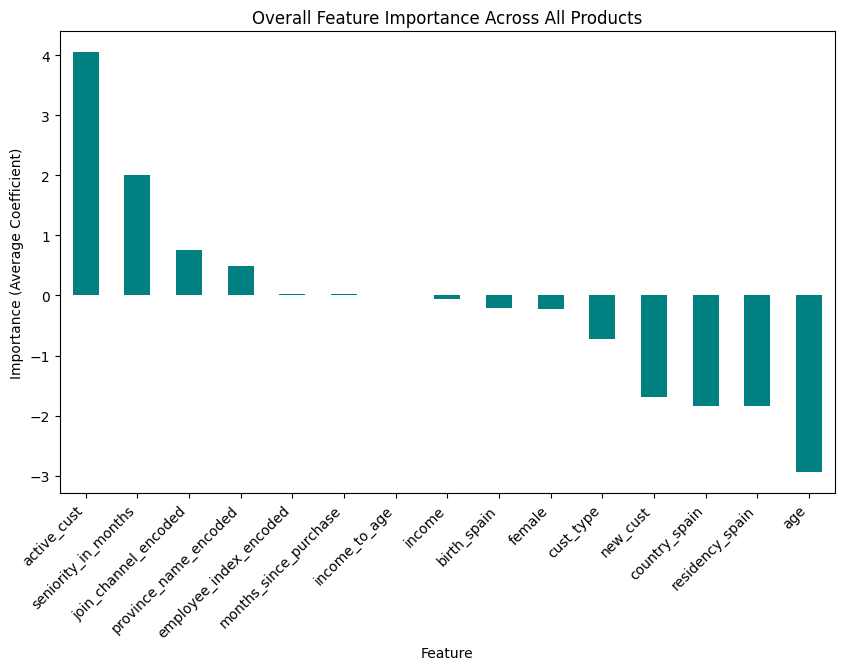

In [ ]:
plt.figure(figsize=(10, 6))
sorted_importances['Mean_Importance'].plot(kind='bar', color='teal')
plt.title('Overall Feature Importance Across All Products')
plt.ylabel('Importance (Average Coefficient)')
plt.xlabel('Feature')
plt.xticks(rotation=45, ha='right')
plt.show()

## LIME example on variable 'savings_acct'  
Here we are trying to get deeper and understand which variables affect the variable 'savings_acct' the most. For the purpose of this exercise we will just run the code on 'savings_acct'

In [ ]:
example_product = 'savings_acct'

#Standardizing features for LIME
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

clf = LogisticRegression(**params)
clf.fit(X_train_scaled, y_train[example_product].values)

# Initializing LIME Tabular Explainer
explainer = LimeTabularExplainer(
    training_data=X_train_scaled,
    training_labels=y_train[example_product],
    feature_names=X_train.columns,
    class_names=['No', 'Yes'],
    mode='classification'
)

# Choosing an instance to explain
instance_idx = 0
instance = X_test_scaled[instance_idx]

# Generating explanation
exp = explainer.explain_instance(
    data_row=instance,
    predict_fn=clf.predict_proba  # Probability prediction function
)
exp.show_in_notebook(show_table=True)  # For Jupyter Notebook
# exp.save_to_file('lime_explanation.html')  # Save to HTML file

Select 5 predictions at random, explain how the model generated those predictions (which features matter more than others), which features need to change and by how much to move the output in a significant way (e.g., to flip the prediction from one class to another)

In [ ]:
# Randomly selecting 5 samples
random_indices = random.sample(range(X_test.shape[0]), 5)
selected_samples = X_test.iloc[random_indices]
selected_labels = y_test[product].iloc[random_indices]

# LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=[f"Not {product}", product],
    verbose=True,
    mode="classification"
)

# Explain each sample
for i, idx in enumerate(random_indices):
    print(f"\nExplaining Prediction {i+1} (Row {idx}):")
    sample = X_test.iloc[idx].values
    
    # Probability for the sample
    prediction = clf.predict_proba([sample])[0]
    predicted_class = np.argmax(prediction)
    print(f"Predicted Class: {predicted_class} (Probability: {prediction[predicted_class]:.2f})")
    
    # Generate explanation
    exp = explainer.explain_instance(sample, clf.predict_proba, num_features=10)
    exp.show_in_notebook(show_table=True)
    
    # Print explanation in text format
    explanation = exp.as_list()
    print("Feature Contributions:")
    for feature, contribution in explanation:
        print(f"{feature}: {contribution:.4f}")
    
    # Identify feature changes to flip prediction
    important_feature, contribution = explanation[0]
    print(f"\nTo flip the prediction, try adjusting '{important_feature}' by a significant amount.")

# Visualize the explanation for one of the samples
exp.show_in_notebook(show_table=True)


Explaining Prediction 1 (Row 950916):
Predicted Class: 1 (Probability: 0.87)
Intercept -0.039240922130545156
Prediction_local [0.15935189]
Right: 0.8716594547837396


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Feature Contributions:
0.00 < active_cust <= 1.00: 0.1687
cust_type <= 1.00: 0.0320
new_cust <= 0.00: 0.0229
age > 0.50: -0.0219
birth_spain <= 0.00: -0.0151
female <= 0.00: 0.0084
1.18 < province_name_encoded <= 1.28: -0.0037
income <= -0.28: 0.0034
0.21 < seniority_in_months <= 0.54: 0.0023
-0.82 < income_to_age <= -0.35: 0.0016

To flip the prediction, try adjusting '0.00 < active_cust <= 1.00' by a significant amount.

Explaining Prediction 2 (Row 3239):
Predicted Class: 0 (Probability: 0.96)
Intercept 0.21402389014112455
Prediction_local [0.03316361]
Right: 0.037688068101520936


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Feature Contributions:
active_cust <= 0.00: -0.1708
employee_index_encoded <= 1.41: -0.0710
1.56 < join_channel_encoded <= 1.94: 0.0472
new_cust <= 0.00: 0.0232
birth_spain <= 0.00: -0.0136
1.28 < province_name_encoded <= 1.75: 0.0093
female <= 0.00: 0.0069
0.39 < age <= 0.50: -0.0056
income > 0.09: -0.0043
cust_type <= 1.00: -0.0021

To flip the prediction, try adjusting 'active_cust <= 0.00' by a significant amount.

Explaining Prediction 3 (Row 458596):
Predicted Class: 0 (Probability: 0.99)
Intercept 0.30015283526118897
Prediction_local [-0.02265368]
Right: 0.014329623063726801


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Feature Contributions:
active_cust <= 0.00: -0.1668
employee_index_encoded <= 1.41: -0.0780
join_channel_encoded <= 0.89: -0.0475
cust_type <= 1.00: -0.0443
new_cust <= 0.00: 0.0195
birth_spain <= 0.00: -0.0178
age <= 0.23: 0.0173
province_name_encoded <= 1.18: -0.0074
female <= 0.00: 0.0067
0.10 < seniority_in_months <= 0.21: -0.0044

To flip the prediction, try adjusting 'active_cust <= 0.00' by a significant amount.

Explaining Prediction 4 (Row 1115023):


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Predicted Class: 1 (Probability: 0.95)
Intercept -0.03681746983404906
Prediction_local [0.22245744]
Right: 0.9472943668943028


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Feature Contributions:
0.00 < active_cust <= 1.00: 0.1695
1.56 < join_channel_encoded <= 1.94: 0.0546
new_cust <= 0.00: 0.0291
birth_spain <= 0.00: -0.0150
1.28 < province_name_encoded <= 1.75: 0.0127
female <= 0.00: 0.0079
0.23 < age <= 0.39: 0.0071
employee_index_encoded <= 1.41: -0.0055
seniority_in_months <= 0.10: -0.0045
income_to_age > 0.23: 0.0035

To flip the prediction, try adjusting '0.00 < active_cust <= 1.00' by a significant amount.

Explaining Prediction 5 (Row 557414):
Predicted Class: 0 (Probability: 0.99)


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Intercept 0.1629545436552834
Prediction_local [-0.02360619]
Right: 0.014531659456663631


c:\Users\MARIA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Feature Contributions:
active_cust <= 0.00: -0.1665
join_channel_encoded <= 0.89: -0.0483
new_cust <= 0.00: 0.0249
birth_spain <= 0.00: -0.0164
age <= 0.23: 0.0161
female <= 0.00: 0.0079
cust_type <= 1.00: 0.0074
0.10 < seniority_in_months <= 0.21: -0.0063
1.18 < province_name_encoded <= 1.28: -0.0042
-0.28 < income <= -0.14: -0.0012

To flip the prediction, try adjusting 'active_cust <= 0.00' by a significant amount.
